# Machine Learning: AllLife Bank Personal Loan Campaign

## Problem Statement

### Context

AllLife Bank is a US bank that has a growing customer base. The majority of these customers are liability customers (depositors) with varying sizes of deposits. The number of customers who are also borrowers (asset customers) is quite small, and the bank is interested in expanding this base rapidly to bring in more loan business and in the process, earn more through the interest on loans. In particular, the management wants to explore ways of converting its liability customers to personal loan customers (while retaining them as depositors).

A campaign that the bank ran last year for liability customers showed a healthy conversion rate of over 9% success. This has encouraged the retail marketing department to devise campaigns with better target marketing to increase the success ratio.

You as a Data scientist at AllLife bank have to build a model that will help the marketing department to identify the potential customers who have a higher probability of purchasing the loan.

### Objective

To predict whether a liability customer will buy personal loans, to understand which customer attributes are most significant in driving purchases, and identify which segment of customers to target more.

### Data Dictionary
* `ID`: Customer ID
* `Age`: Customer’s age in completed years
* `Experience`: #years of professional experience
* `Income`: Annual income of the customer (in thousand dollars)
* `ZIP Code`: Home Address ZIP code.
* `Family`: the Family size of the customer
* `CCAvg`: Average spending on credit cards per month (in thousand dollars)
* `Education`: Education Level. 1: Undergrad; 2: Graduate;3: Advanced/Professional
* `Mortgage`: Value of house mortgage if any. (in thousand dollars)
* `Personal_Loan`: Did this customer accept the personal loan offered in the last campaign? (0: No, 1: Yes)
* `Securities_Account`: Does the customer have securities account with the bank? (0: No, 1: Yes)
* `CD_Account`: Does the customer have a certificate of deposit (CD) account with the bank? (0: No, 1: Yes)
* `Online`: Do customers use internet banking facilities? (0: No, 1: Yes)
* `CreditCard`: Does the customer use a credit card issued by any other Bank (excluding All life Bank)? (0: No, 1: Yes)

## Importing necessary libraries

In [4]:
# Installing the libraries with the specified version.
#!pip install numpy==1.25.2 pandas==1.5.3 matplotlib==3.7.1 seaborn==0.13.1 scikit-learn==1.2.2 sklearn-pandas==2.2.0 -q --user

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again.*

In [5]:
# please uncomment and run the next line if yellowbrick library is not previously installed
#!pip install yellowbrick

In [6]:
# import libraries for data manipulation
import numpy as np # Fundamental package for scientific computing in Python.
import pandas as pd # Open source library providing easy to use  and high-performance data structures and data analysis tools.
import plotly.express as px
# import libraries for data visualization
import matplotlib.pyplot as plt # Used for creating interactive visualizations.
import seaborn as sns  # Data visualization library based on matplotlib to provide a high-level interface for drawing informative graphics.
import warnings # Warnings library
warnings.filterwarnings('ignore')

sns.set_theme()
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)
# to scale the data using z-score
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
# to compute distances
from scipy.spatial.distance import cdist
from sklearn import metrics
# to perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# to visualize the elbow curve and silhouette scores
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.metrics import confusion_matrix, classification_report
# Library to split data
from sklearn.model_selection import train_test_split

# To build model for prediction
import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from statsmodels.tools.tools import add_constant
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import precision_recall_curve
#from sklearn.metrics import plot_confusion_matrix
# To get diferent metric scores
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    roc_curve,
    make_scorer,
)

## Loading the dataset

In [7]:
#For using with Google Colab use by uncommenting below codes

#from google.colab import drive
#drive.mount('/content/drive')

# read the data
    #df = pd.read_csv('/content/drive/My Drive/Python Course/foodhub_order.csv')
# returns the first 5 rows
    #df.head()

In [10]:
# read the data
data = pd.read_csv("Loan_Modelling.csv")
# returns the first 5 rows
data.head()

,ID,Age,Experience,Income,ZIPCode,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1


In [6]:
data.shape

(5000, 14)

* Data has got 5000 rows and 14 Columns.
* The dataset contains information about different customers holding accounts with AllLife Bank.

In [7]:
# Keep a copy of the DataFrame to maintain a backup of original data
df=data.copy()

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  5000 non-null   int64  
 1   Age                 5000 non-null   int64  
 2   Experience          5000 non-null   int64  
 3   Income              5000 non-null   int64  
 4   ZIPCode             5000 non-null   int64  
 5   Family              5000 non-null   int64  
 6   CCAvg               5000 non-null   float64
 7   Education           5000 non-null   int64  
 8   Mortgage            5000 non-null   int64  
 9   Personal_Loan       5000 non-null   int64  
 10  Securities_Account  5000 non-null   int64  
 11  CD_Account          5000 non-null   int64  
 12  Online              5000 non-null   int64  
 13  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 547.0 KB


In [9]:
data.duplicated().sum()

0

* No duplicate data is found in the given Data set.

* Out of 14 columns in the given Data, 13 are of type numeric (int64) and the other 1 is a (float64) type column.

#### We don't need the 'ID' column for data analysis, so removing it from the data.

In [10]:
df.drop("ID", axis=1, inplace=True)

In [11]:
data.reset_index()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 5000 non-null   int64  
 1   Experience          5000 non-null   int64  
 2   Income              5000 non-null   int64  
 3   ZIPCode             5000 non-null   int64  
 4   Family              5000 non-null   int64  
 5   CCAvg               5000 non-null   float64
 6   Education           5000 non-null   int64  
 7   Mortgage            5000 non-null   int64  
 8   Personal_Loan       5000 non-null   int64  
 9   Securities_Account  5000 non-null   int64  
 10  CD_Account          5000 non-null   int64  
 11  Online              5000 non-null   int64  
 12  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(12)
memory usage: 507.9 KB


* Now we removed the ID column and the DataFrame has got 5000 rows and 13 Columns, that we analyse.

In [12]:
# Check for any duplicate observstions data
df.duplicated().sum()

0

* No duplicate observations found in the given data.

In [13]:
# Checking the missing values using isnull() function.
df.isnull().sum()

Age                   0
Experience            0
Income                0
ZIPCode               0
Family                0
CCAvg                 0
Education             0
Mortgage              0
Personal_Loan         0
Securities_Account    0
CD_Account            0
Online                0
CreditCard            0
dtype: int64

* No Null/missing values observations found in the given data.

### Statistical Summary & Observations

In [14]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,5000.0,45.338400,11.463166,23.0,35.0,45.0,55.0,67.0
Experience,5000.0,20.104600,11.467954,-3.0,10.0,20.0,30.0,43.0
Income,5000.0,73.774200,46.033729,8.0,39.0,64.0,98.0,224.0
ZIPCode,5000.0,93169.257000,1759.455086,90005.0,91911.0,93437.0,94608.0,96651.0
Family,5000.0,2.396400,1.147663,1.0,1.0,2.0,3.0,4.0
CCAvg,5000.0,1.937938,1.747659,0.0,0.7,1.5,2.5,10.0
Education,5000.0,1.881000,0.839869,1.0,1.0,2.0,3.0,3.0
Mortgage,5000.0,56.498800,101.713802,0.0,0.0,0.0,101.0,635.0
Personal_Loan,5000.0,0.096000,0.294621,0.0,0.0,0.0,0.0,1.0
Securities_Account,5000.0,0.104400,0.305809,0.0,0.0,0.0,0.0,1.0


##### * Analysing the probable error data and extracting it to a different DataFrame for further check

In [15]:
df_error = df[(df.Experience < 0)]
df_error.shape

(52, 13)

In [16]:
df_error.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,52.0,24.519231,1.475159,23.0,24.00,24.0,25.000,29.0
Experience,52.0,-1.442308,0.639039,-3.0,-2.00,-1.0,-1.000,-1.0
Income,52.0,69.942308,37.955295,12.0,40.75,65.5,86.750,150.0
ZIPCode,52.0,93240.961538,1611.654806,90065.0,92167.75,93060.0,94720.000,95842.0
Family,52.0,2.865385,0.970725,1.0,2.00,3.0,4.000,4.0
CCAvg,52.0,2.129423,1.750562,0.2,1.00,1.8,2.325,7.2
Education,52.0,2.076923,0.836570,1.0,1.00,2.0,3.000,3.0
Mortgage,52.0,43.596154,90.027068,0.0,0.00,0.0,0.000,314.0
Personal_Loan,52.0,0.000000,0.000000,0.0,0.00,0.0,0.000,0.0
Securities_Account,52.0,0.115385,0.322603,0.0,0.00,0.0,0.000,1.0


* 52 customers data is observed with some error in their experince column
* The Age of these customers are ranging from 23 to 29 
* None of them are having personal loans.

In [17]:
df.isna().sum()

Age                   0
Experience            0
Income                0
ZIPCode               0
Family                0
CCAvg                 0
Education             0
Mortgage              0
Personal_Loan         0
Securities_Account    0
CD_Account            0
Online                0
CreditCard            0
dtype: int64

* No missing values in given data set.

## Data Overview

### Observations
* In the 'Experience' Column we observe a min of (-3) which may be an error. For the same average is 20 and max years 
  observed is 43.
* Customers are between the age group of 23 and 67 with an average 'Age' of 45. More than 50% of the customers are aged 
  above 45 years.
* Customers average 'Income' is ~ 74,000 with a min income of USD 8,000 and ranging to a max of USD 224,000. Its observed 
  that 50% of the customers in the given dataset is having income above  64,000 USD.
* Customers average 'Family' size is 2 with a min size of 1 and a max of 4. Its observed that 50% of the customers in 
  the given dataset is having family size of 2 or above.
* The average spending 'CCAvg' on credit cards per month is ~ 2,000 USD. With some customers spending a max of 10,000 USD.
* The average per head 'Mortgage' held is around USD 56,000, the data shows '0' values for more than 50% of customers. The 
  standard deviation is 101,713 USD, which is very far from the mean, it means only approximately around 50% of the 
  customers are having housing mortgages. More deailed analysis is required to find the exact distribution.
* Min 'Education' level of customers are observed as 1: Undergrad more of them appears to be 2: Graduate or 
  3: Advanced/Professional. More details are to be analyzed by category.
* Rest of the columns Personal_Loan, Securities_Account, CD_Account, Online and CreditCard are 'Categorical' and should 
  be analyzed for more detailed results.
  

* 

## Exploratory Data Analysis.

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

### The below functions need to be defined to carry out the EDA.

In [18]:
# function to plot a boxplot and a histogram along the same scale.
## Function copied from the Solution Notebook - WHO Case Study

def histogram_boxplot(data, feature, figsize=(10, 5), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="Pink"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="Red"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [19]:
# function to create labeled barplots
## Function copied from the Solution Notebook - WHO Case Study

def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=10,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [20]:
## Function copied from the Solution Notebook - WHO Case Study
def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 5, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

In [21]:
### function to plot distributions wrt target
### Function copied from the Solution Notebook - WHO Case Study


def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
        stat="density",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
        stat="density",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

### Univariate Analysis 

#### We shall analyse the columns independantly using the above defined function

##### Analyze by  'Age'

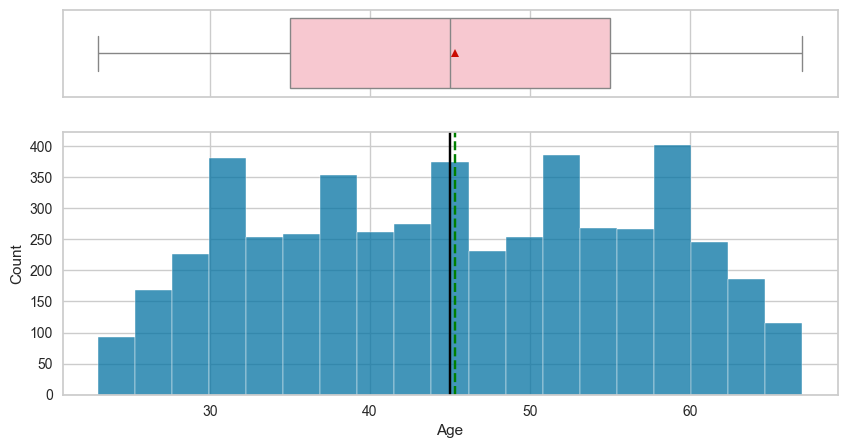

In [22]:

histogram_boxplot(df, "Age")

* Age distribution is almost normal ranging between 23 to 67

##### Analyze by "Experience"

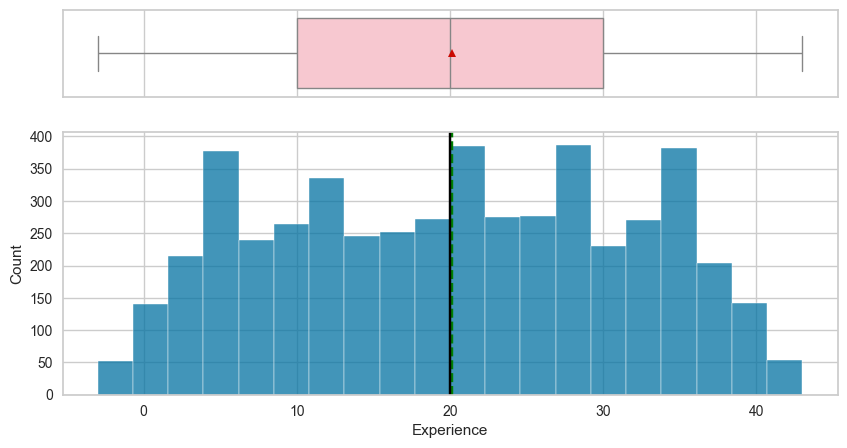

In [23]:
histogram_boxplot(df, "Experience")

#### Observations

* We observe a similar normal distribution for Experience as we observed for age. 
* As we observed earlier Experience data is having (-ve) values, which has to be treated appropriately.
* Majority of the customers are having 10 to 30 years of professional experince.


##### Analyze by "Income"

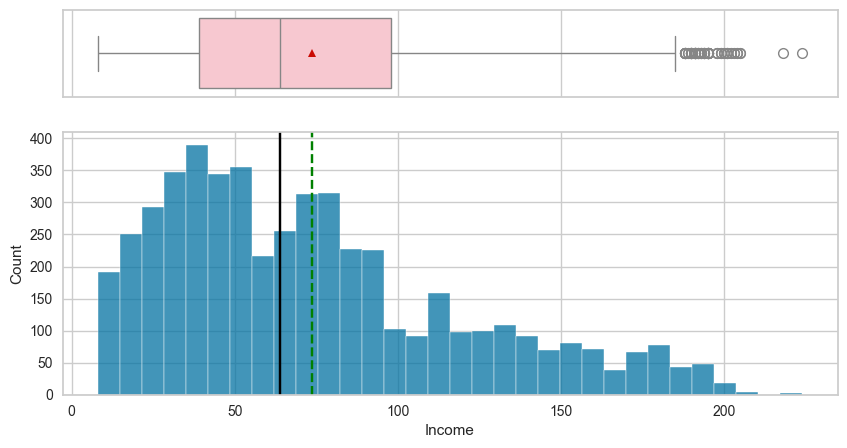

In [24]:
histogram_boxplot (df, "Income")

In [25]:
# Find the number of customers above and below the median income of 64k
count_below_64k = (df['Income'] < 64).sum()
count_above_64k = (df['Income'] >= 64).sum()

In [26]:
print("Number of customers with income less than 64,000:", count_below_64k)
print("Number of customers with income more than or equal to 64,000:", count_above_64k)

Number of customers with income less than 64,000: 2490
Number of customers with income more than or equal to 64,000: 2510


* The boxplot is observed to have more outliers,which has to be treated appropriately.
* The median income is 64,000 USD and 2490 customers earn less than the median income and 2510 customer earn 
  more than or equal to 64,000 USD.
* The income disctribution is observed as righ skewed.

##### Analyze by "Family"

In [27]:
family_size_counts = df['Family'].value_counts()
# Ploting a pie chart to show the family strenth-wise distribution
fig = px.pie(family_size_counts, values='Family', names=family_size_counts.index, title='Distribution of Family Size',hole=.3,color_discrete_sequence=px.colors.sequential.RdBu,hover_data=['Family'], labels={'index':'Family Size','Family':'Count'})
fig.show()

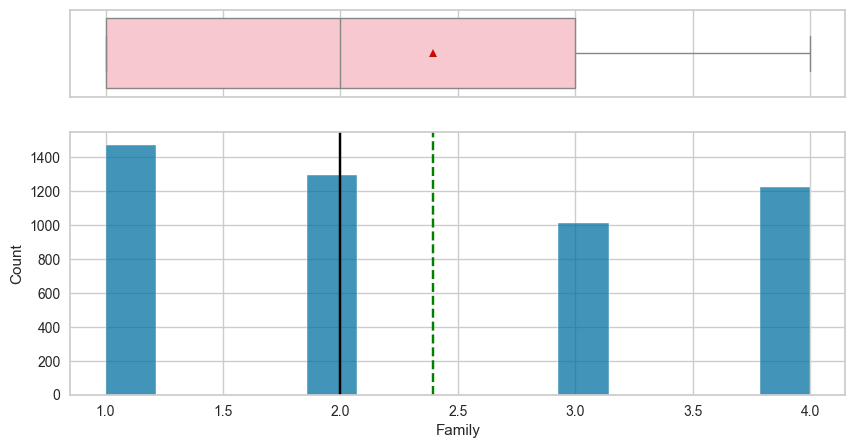

In [28]:
histogram_boxplot(df, "Family")

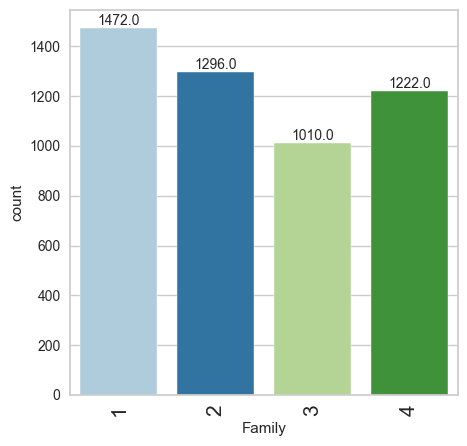

In [29]:
labeled_barplot(df, "Family")

#####  Observations

* 29.4% of the customers are individuals, maybe unmarried, an age-family comparison can give more details.
* 25.9% of the customers are with Family size of 2 (May be new family/ without kids)
* 20.2% of the customers are having family size of 3.
* 24.4% of the customers are having family size of 4.
* The Family distribution is observed as lightly righ skewed.

##### Analyze by "CCAvg" - Average spending on credit cards per month

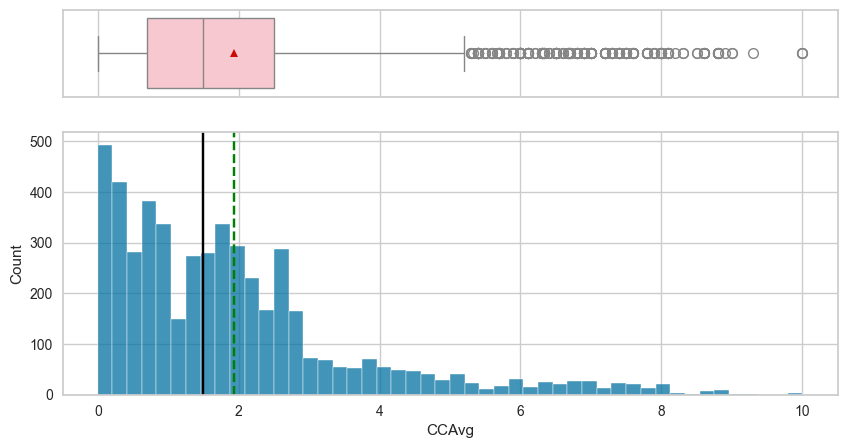

In [30]:
histogram_boxplot(df, "CCAvg")

In [31]:
count_below_med = (df['CCAvg'] < 1.8).sum()
count_above_med = (df['CCAvg'] >= 1.8).sum()
print("Number of customers spending less than 1.8K:", count_below_med)
print("Number of customers spending more than 1.8K:", count_above_med)

Number of customers spending less than 1.8K: 2801
Number of customers spending more than 1.8K: 2199


#### Ans to Q2. How many customers have credit cards?

In [32]:
# Customers having no credit card spending from All Life Bank Card
cc_usage_zero = (df.CCAvg == 0).sum()
# Customers having credit card spending from All Life Bank Card
cc_used_count = (df.CCAvg > 0).sum()

print("Number of customers not having Credit Card spending:", cc_usage_zero)
print("Number of customers having Credit Card spending:", cc_used_count)

# Finding Customers having other bank credit card but not from All Life Bank
# Filter the Data where credit_usage is 0 and other bank CreditCard is 1
filtered_df = df[(df['CCAvg'] == 0) & (df['CreditCard'] == 1)]

# Count the number of rows in the filtered_df
count = len(filtered_df) 

print("Customers with credit usage 0 and having other bank card is:", count)

Number of customers not having Credit Card spending: 106
Number of customers having Credit Card spending: 4894
Customers with credit usage 0 and having other bank card is: 28


#### Observations

* The boxplot observation is evidently showing a lot of outliers.
* The Credit Card Avg spending per month data is right skewed.
* The number of customers spending below 1.8K is 2801 and above 1.8K is 2199.
* The number of customers having credit card spending is 4894 and rest of the 106 shows no spending. So, we can conclude 
  4894 as the number of customers having Credit Card from All Life Bank.
* Customers not having All Life Bank CC but having other bank cards is 28.
* Total number of customers having Credit Card is approx (4894 + 28 ) = 4922.
* In addition there is a possibility that some customers having credit card from All Life bank may not be using it so the 
  CCAvg is 0. The given data is insufficient to find that because no Flag is available to identify the same in the Data.

##### Analyze by "Education"

In [33]:
education_levels = df.copy()
# Map Education Levels as per legent
education_levels['Edu_Levels'] = df['Education'].map({1:'Under Graduate', 2: 'Graduate', 3:'Advanced/Professional'})
education_levels = education_levels['Edu_Levels'].value_counts()
# Ploting a pie chart to show the Customer Education_Level wise distribution where 
fig = px.pie(education_levels, values='Edu_Levels', names= education_levels.index , title='Distribution of Education Levels',hole=.3, hover_data=['Edu_Levels'], labels={'index':'Level','Edu_Levels':'Count'})
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

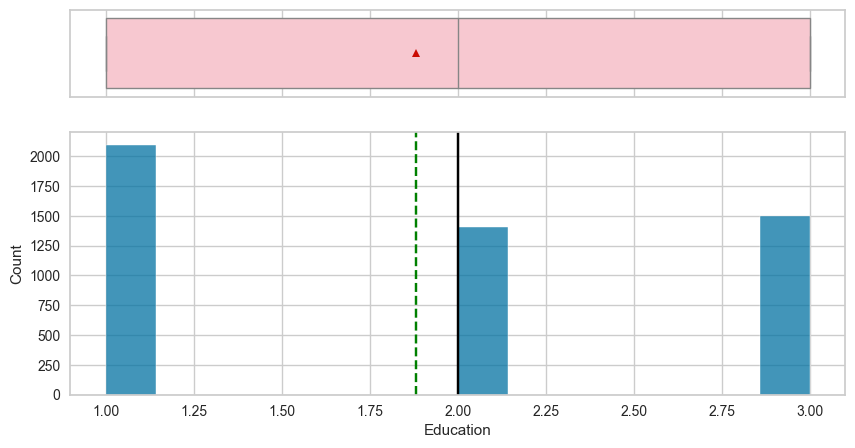

In [34]:
histogram_boxplot(df, "Education")

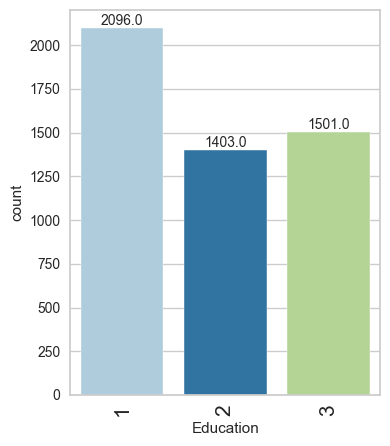

In [35]:
labeled_barplot(df, "Education")

#### Observations

* The distribution shows 2096 - Undergrads ; 1403 - Graduates and 1501 - Advanced/Professionals
* The data is lightly right skewed.
* Majority of customers are Undergrads forming (41.9%) followed by Advanced/Professionals (30.0%).

##### Analyze by "Mortgage"


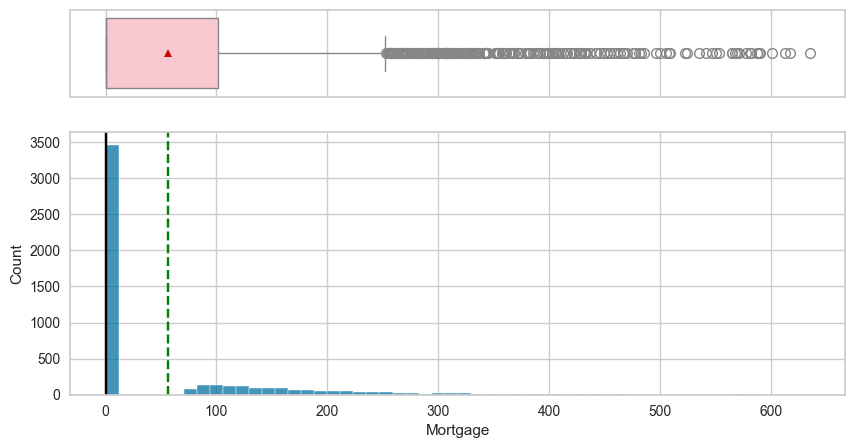

In [36]:
histogram_boxplot(df, "Mortgage")

In [37]:
df_mortgage = df.copy() # Duplicate the DataFrame for temporary usage to find the mortgage status.
df_mortgage['Mortgage_Status'] = df['Mortgage'] > 0
df_mortgage['Availability'] = df_mortgage['Mortgage_Status'].map({True: 'Having Mortgage', False: 'No Mortgage'})
mortgage_count = df_mortgage['Availability'].value_counts()
# Plot the result to a pie chart
fig = px.pie(mortgage_count, values='Availability', names= mortgage_count.index, title='Distribution of Mortgage',hole=.3,
             hover_data=['Availability'], labels={'index':'Status','Availability':'Count'})
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()


#### Observations
#### Ans. to Que 1. What is the distribution of mortgage attribute? Are there any noticeable patterns or outliers in the distribution?
* In the boxplot we observe significantly high outliers which should be analized for more details and be cleaned if necessary.
* The data is very highly right skewed.
* Only 30.8% (1538) customers out of 5000 are having a mortgage.
* Majority of customers 69.25 (3462) out of 5000 are not having mortgage.

##### Analyze by "Personal Loan"

In [38]:
df_pers_loan = pd.DataFrame(df.copy())
df_pers_loan['Loan_Status'] = df['Personal_Loan'] == 1 #Get personal loan accepted status
# Mapping the True / False to string label for pie-chart
df_pers_loan['Loan_Campaign'] =df_pers_loan['Loan_Status'].map({True:'Accepted', False:'Not Accepted'})
# Get the count using value_counts() function
df_pers_loan_count = df_pers_loan['Loan_Campaign'].value_counts()

# Plot the chart using derived data.
fig = px.pie(df_pers_loan_count, values='Loan_Campaign', names= df_pers_loan_count.index, title='Distribution of Personal Loan',
       hole=.3,hover_data=['Loan_Campaign'], labels={'index':'Status','Loan_Campaign':'Count'})
fig.update_traces(textposition='inside', textinfo='percent+label', pull=[0.1, 0])

fig.show()


#### Observations
* Out of 5000 customers, only 480 (9.6%) has accepted the personal loan during the campaign.
* Majority of customers 4520 (90.4%) have not accepted personal loan.
* Furthermore investigation is needed to find the details of customers who tend to accept loans, so as to compare with the 
  rest of data and find the prospects.

##### Analyze by "Securities_Account"

In [39]:
df_sec_account = pd.DataFrame(df.copy())
df_sec_account ['Sec_Status'] = df['Securities_Account'] == 1 # Get Securities Account status
# Mapping the True / False to string label for pie-chart
df_sec_account ['Availability'] =df_sec_account ['Sec_Status'].map({True:'Available', False:'Not Available'})
# Get the count using value_counts() function
df_sec_account_count = df_sec_account['Availability'].value_counts()

# Plot the chart using derived data.
fig = px.pie(df_sec_account_count, values='Availability', names= df_sec_account_count.index, title='Distribution of Security Account',
       hole=.3, hover_data=['Availability'], labels={'index':'Status','Availability':'Count'})
fig.update_traces(textposition='inside', textinfo='percent+label', pull=[0.1, 0])

fig.show()


#### Observations
* Out of 5000 customers only 10.4% (522) are having Security account with the bank.
* Further exploration is needed to find the percentage of customers obtained personal loans in this group.

##### Analyze by "CD_Account"

In [40]:
df_cd_account = pd.DataFrame(df.copy())
df_cd_account ['Cd_Status'] = df['CD_Account'] == 1 # Get Securities Account status
# Mapping the True / False to string label for pie-chart
df_cd_account ['Availability'] =df_cd_account ['Cd_Status'].map({True:'Available', False:'Not Available'})
# Get the count using value_counts() function
df_cd_account_count = df_cd_account['Availability'].value_counts()

# Plot the chart using derived data.
fig = px.pie(df_cd_account_count, values='Availability', names= df_cd_account_count.index, title='Distribution of CD Account',
             hole=.3, hover_data=['Availability'], labels={'index':'Status','Availability':'Count'})
fig.update_traces(textposition='inside', textinfo='percent+label', pull=[0.1, 0])
fig.show()

#### Observations
* Out of 5000 customers only 6.04% (302) are having Certificate of Deposit account with the bank.
* Further exploration is needed to find the percentage of customers obtained personal loans in this group.

##### Analyze by "Online"

In [41]:
df_online = pd.DataFrame(df.copy())
df_online ['Ol_Status'] = df['Online'] == 1 # Get Securities Account status
# Mapping the True / False to string label for pie-chart
df_online ['Usage'] =df_online ['Ol_Status'].map({True:'Using', False:'Not Using'})
# Get the count using value_counts() function
df_online_count = df_online['Usage'].value_counts()
# Plot the chart using derived data.

fig = px.pie(df_online_count, values='Usage', names= df_online_count.index, title='Distribution of Online',
       hole=.3, hover_data=['Usage'], labels={'index':'Status','Usage':'Count'})
fig.update_traces(textposition='inside', textinfo='percent+label', pull=[0.1, 0])
fig.show()

#### Observations
* Out of 5000 customers 59.7% (2984) are using the online internet banking facility.
* 40.3% (2016) customers are not using the online internet banking facility.

##### Analyze by "CreditCard"

In [42]:
df_other_card = pd.DataFrame(df.copy())
df_other_card ['Oc_Status'] = df['CreditCard'] == 1 # Get Securities Account status
# Mapping the True / False to string label for pie-chart
df_other_card ['Usage'] =df_other_card ['Oc_Status'].map({True:'Yes', False:'No'})
# Get the count using value_counts() function
df_other_card_count = df_other_card['Usage'].value_counts()

# Plot the chart using derived data.
fig = px.pie(df_other_card_count, values='Usage', names= df_other_card_count.index, title='Are they using Other Bank credit Cards',
       hole=.3, hover_data=['Usage'], labels={'index':'Status','Usage':'Count'})
fig.update_traces(textposition='inside', textinfo='percent+label', pull=[0.1, 0])

fig.show()

#### Observations
* Out of 5000 customers 29.4% (1470) are using the other bank credit cards.
* 70.6% (3530) customers using the other bank credit cards.

####  Bivariate Analysis

#### Checking Correlations

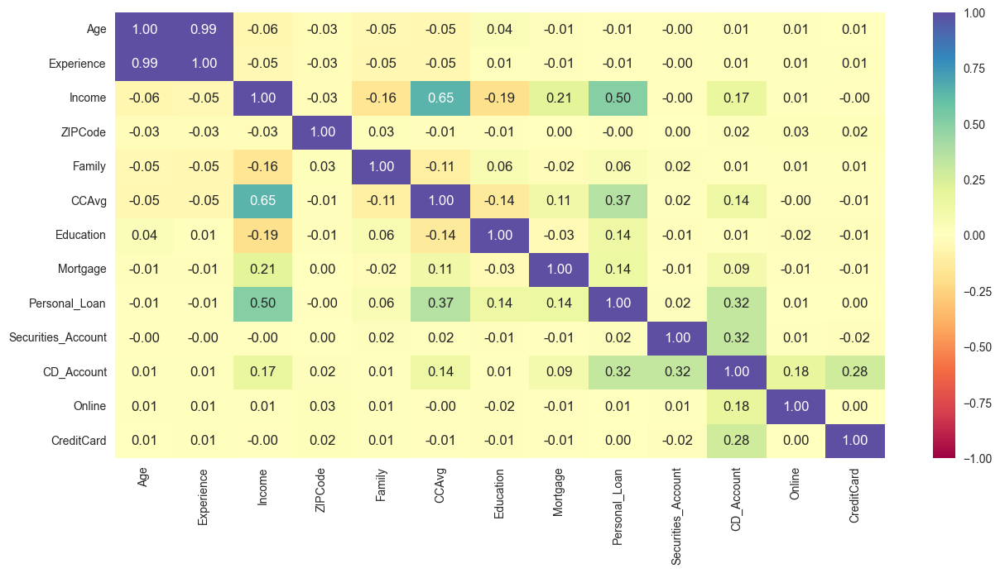

In [43]:
# selecting numerical columns
plt.figure(figsize=(15, 7))
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

 **Observations**

* We observe that the Age and the Experience are having very strong correlation. Both variables are not showing 
  reasonable correlation with any other variables.
* CCAvg and Income are showing strong positive correlation, it shows that the Income is influensing the customers 
  spending nature.
* Mortgage and Income are showing a weak correlation.
* Family size is not showing any noticeable correlation with other variables.
* CD_Account and CreditCard (Other bank credit card holders) are showing a weak correlation but this relation is no way 
  related to our target.
* ZIPCode and Online are not having any significant correlation with other variables.

#### Ans. to Q3. What are the attributes that have a strong correlation with the target attribute (personal loan)?
* Our analysis target variable Personal_Loan is having strong correlation with the variables Income, CCAvg and, CD_Account 
  accordingly.
* Education and Mortgage are showing equal very weak correlation with Personal_Loan. 
* So, it is obvious that these are the factors Income, CCAvg and, CD_Account are strongly affecting the probability of a positive decision making for personal loans. Also Education and Mortgage are having a nominal influence.

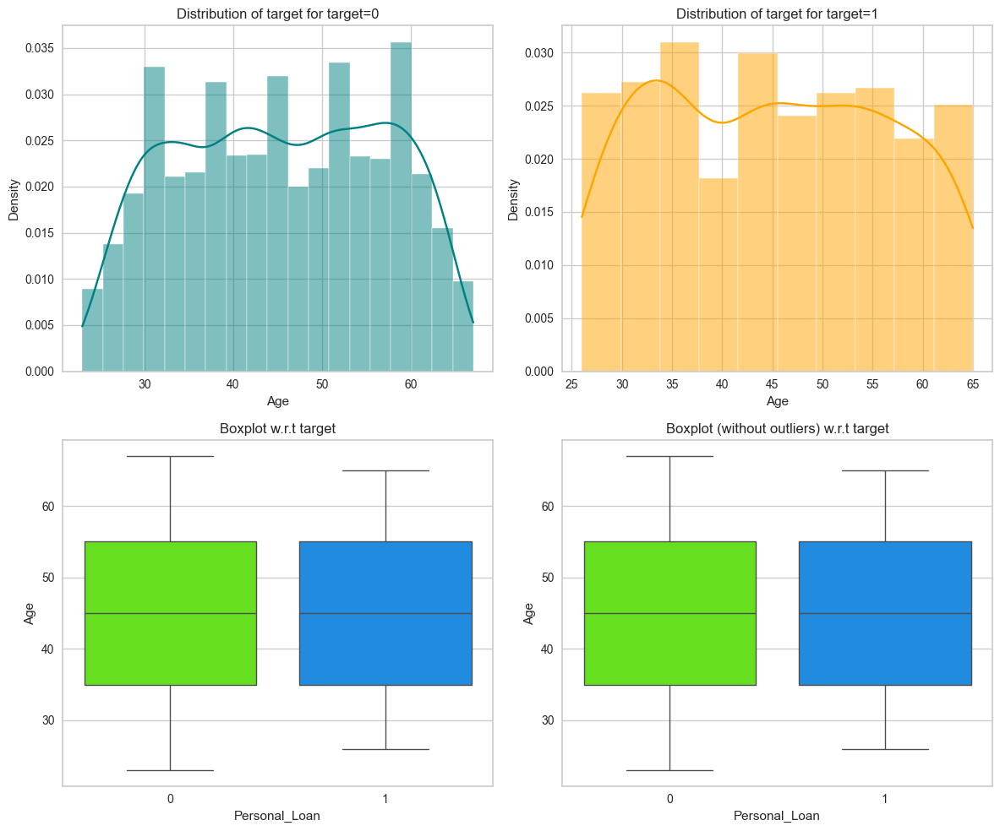

In [44]:
# Selecting all numeric columns
num_col = df.select_dtypes(include=np.number).columns.tolist()

distribution_plot_wrt_target(df, "Age", "Personal_Loan")
#sns.pairplot(data=df[num_col], diag_kind="kde")
#plt.show()

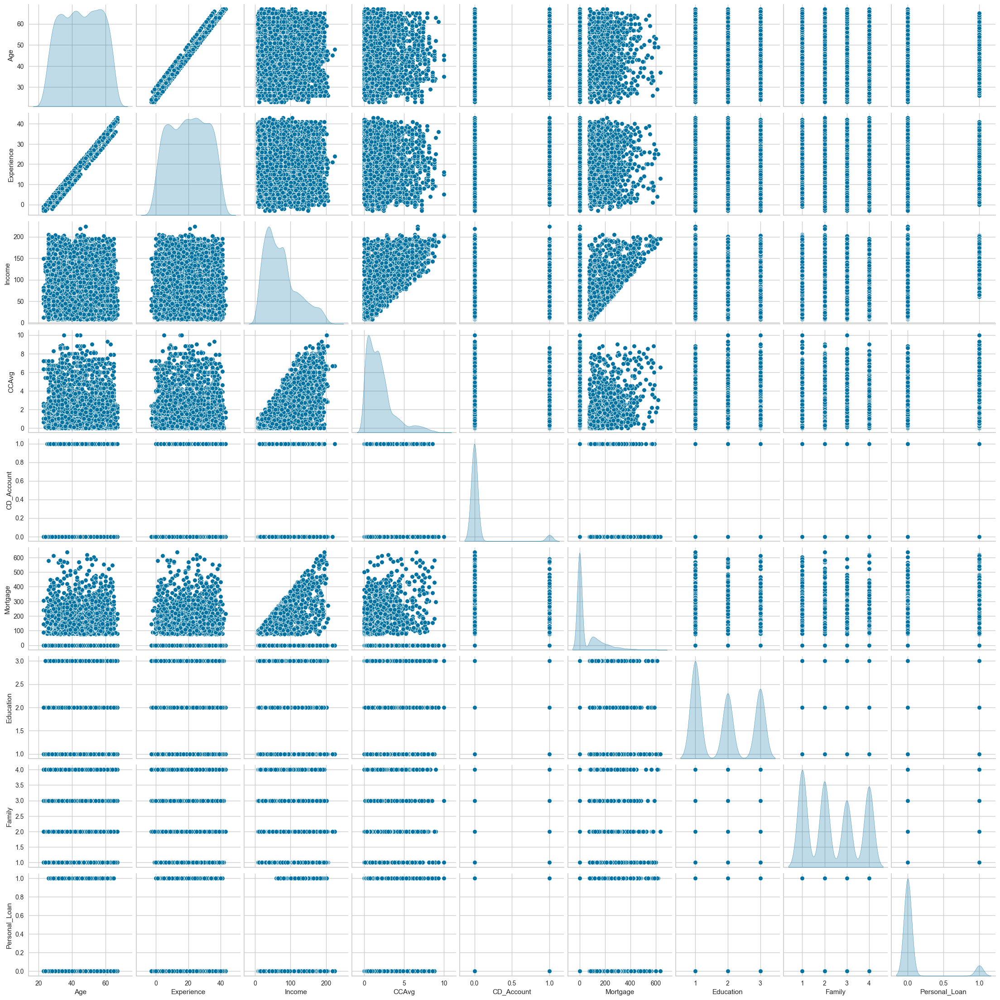

In [45]:
# selecting only significant columns for pairplot for better observation
selected_columns = ['Age','Experience','Income','CCAvg','CD_Account','Mortgage','Education','Family','Personal_Loan']
selected_df = df[selected_columns]
#num_col = df.select_dtypes(include=np.number).columns.tolist()

sns.pairplot(data=selected_df, diag_kind="kde")
plt.show()

**Observations**
* The observations from the pair plot also gives the same correlation details as in the heatmap.
* Age and Experience are showing very strong correlation growing linearly and their distribution is normal.


**Questions**:

1. What is the distribution of mortgage attribute? Are there any noticeable patterns or outliers in the distribution?
2. How many customers have credit cards?
3. What are the attributes that have a strong correlation with the target attribute (personal loan)?
4. How does a customer's interest in purchasing a loan vary with their age?
5. How does a customer's interest in purchasing a loan vary with their education?

#### Q4. How does a customer's interest in purchasing a loan vary with their age?

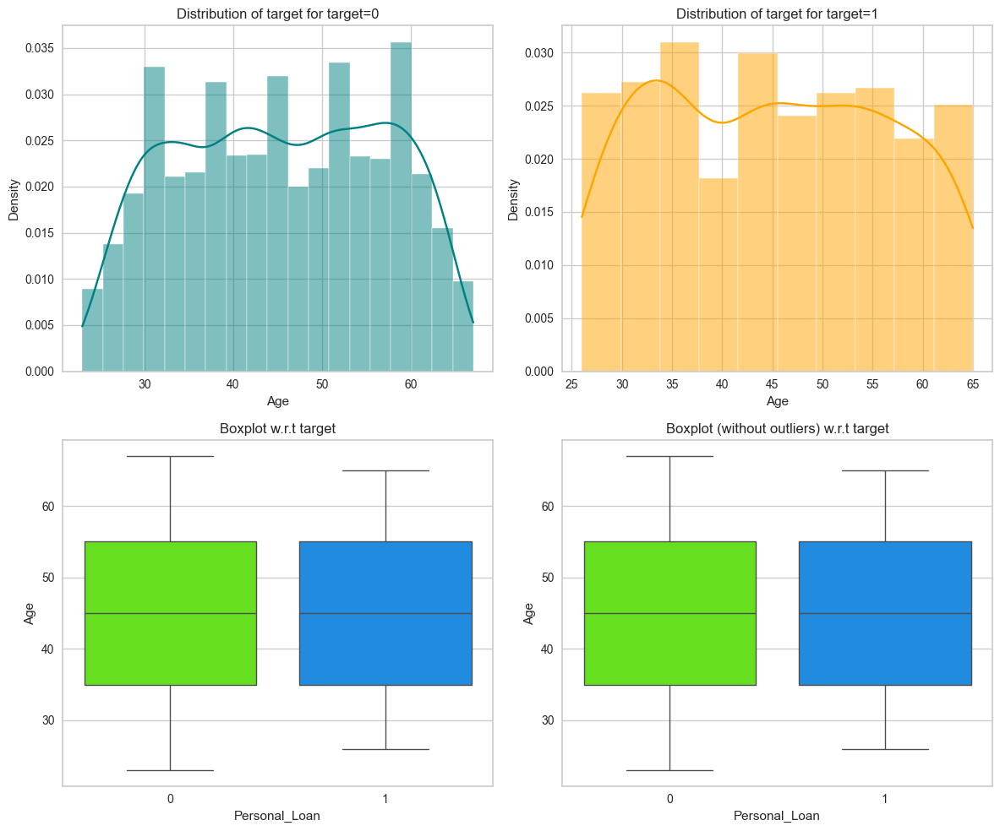

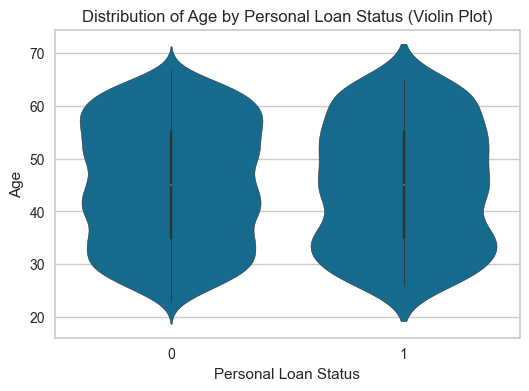

In [46]:
# Analysing the relationships between Age and the target variable Personal_Loan
distribution_plot_wrt_target(df, "Age", "Personal_Loan")

plt.figure(figsize=(6, 4))
sns.violinplot(x="Personal_Loan", y="Age", data=df)
plt.title("Distribution of Age by Personal Loan Status (Violin Plot)")
plt.xlabel("Personal Loan Status")
plt.ylabel("Age")
plt.show()

#### Observations - Ans to Q4

* Age distribution is nearly normal
* As we know from earlier observations the min age is 23 and max age is 67.
* We observe that the Personal loan is mainly selected by customers between the ages 35 to 55. The customers having 
  Personal loan and not having personal loan are almost equally distributed between this age frame of 35 to 55.

##### Analysing the relationships between Experience and the target variable Personal_Loan

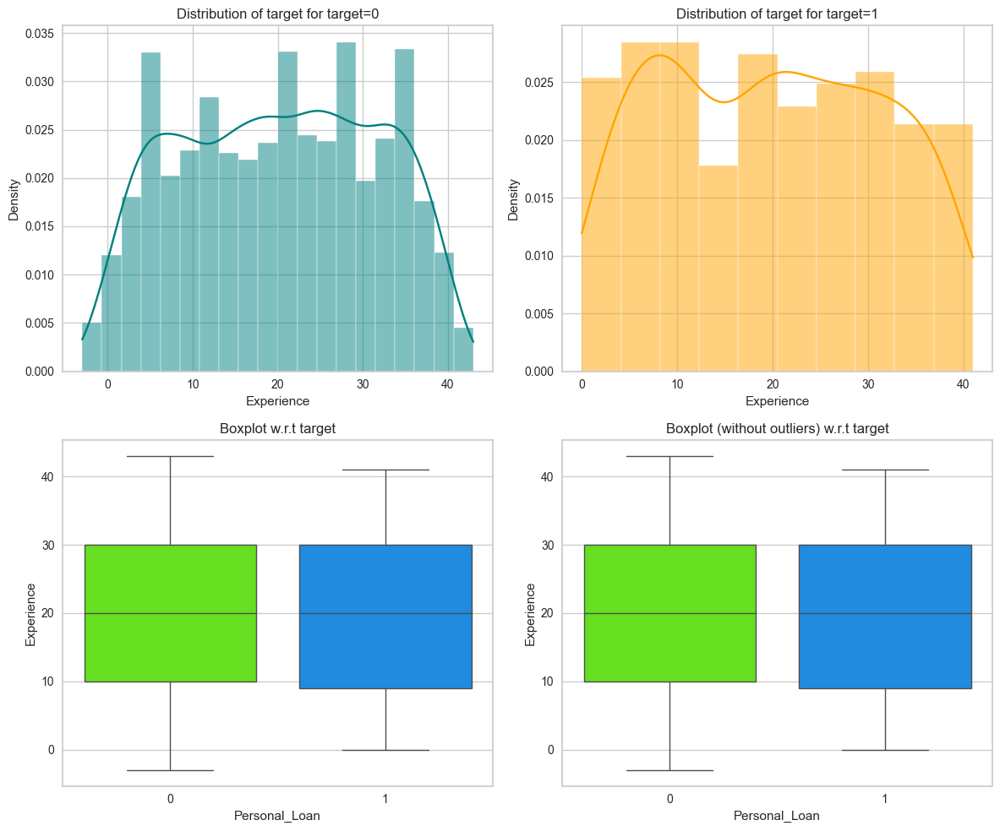

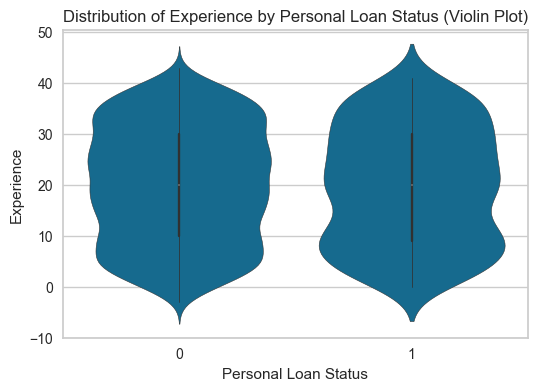

In [47]:
# Analysing the relationships between Experience and the target variable Personal_Loan

distribution_plot_wrt_target(df, "Experience", "Personal_Loan")

plt.figure(figsize=(6, 4))
sns.violinplot(x="Personal_Loan", y="Experience", data=df)
plt.title("Distribution of Experience by Personal Loan Status (Violin Plot)")
plt.xlabel("Personal Loan Status")
plt.ylabel("Experience")
plt.show()

#### Observations

* We observe a similar normal distribution for Experience as we observed for age. 
* Majority of the customers having 10 to 30 years of professional experience.
* We observe that the Personal loan is mainly selected by customers having the professional experience of 10 to 30 years.
* The customers having personal loan and not having personal loan are almost equally distributed between the 
  professional experience of 10 and 30.

##### Analysing the relationships between Income and the target variable Personal_Loan

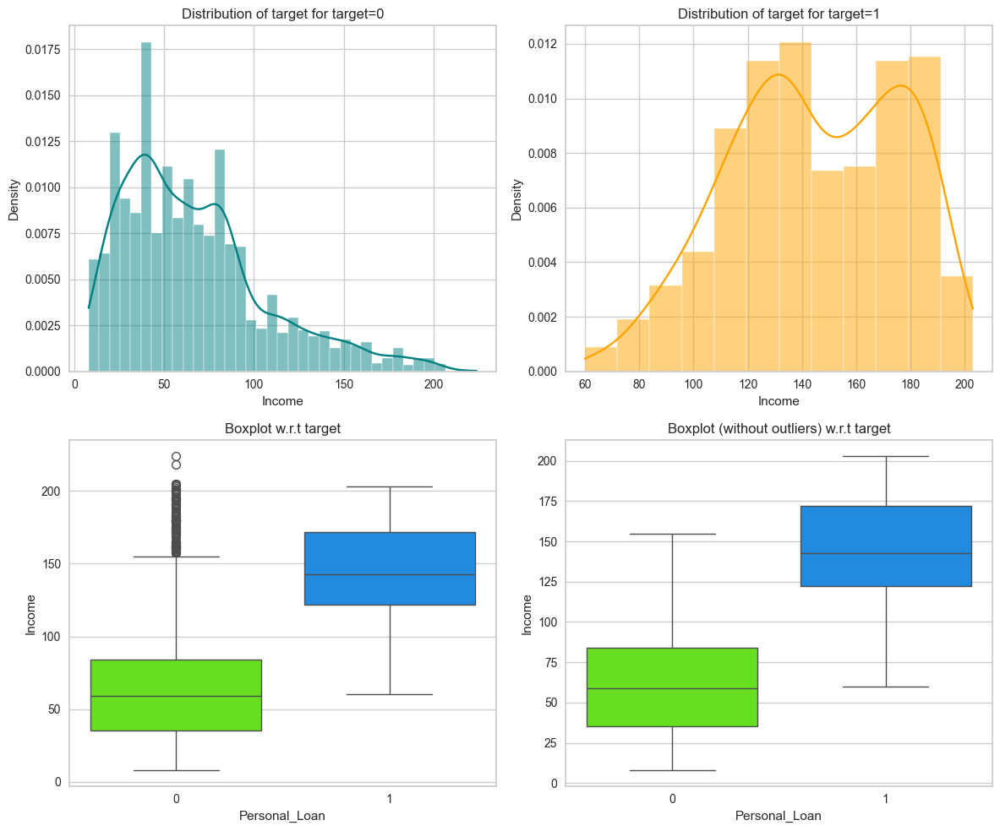

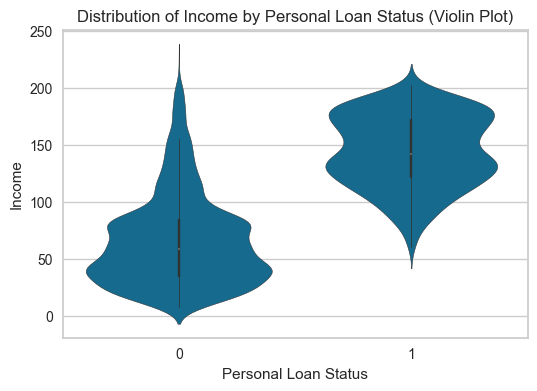

In [48]:
# Analysing the relationships between Income and the target variable Personal_Loan

distribution_plot_wrt_target(df, "Income", "Personal_Loan")

plt.figure(figsize=(6, 4))

sns.violinplot(x="Personal_Loan", y="Income", data=df)
plt.title("Distribution of Income by Personal Loan Status (Violin Plot)")
plt.xlabel("Personal Loan Status")
plt.ylabel("Income")
plt.show()

#### Observations

* The boxplot is observed to have more outliers,which has to be treated appropriately.
* The income disctribution is observed as righ skewed.
* Majority of the personal loan acceptance occured from customers having income more than ~90K and less than 190K. 
  This shows that the customers having income range in this group are most likely to accept personal loans.

##### Analysing the relationships between Family and the target variable Personal_Loan

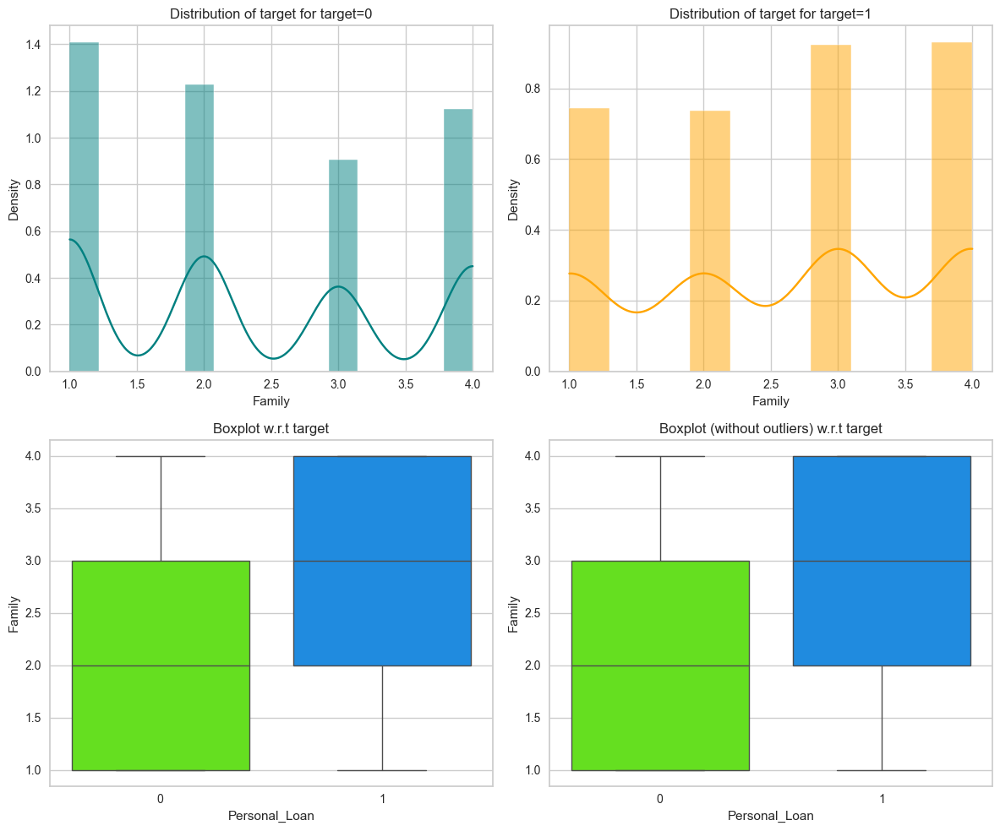

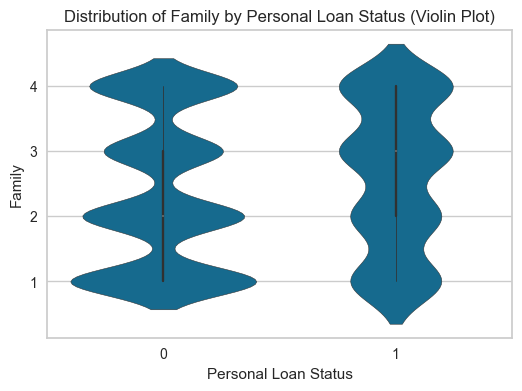

In [49]:
# Analysing the relationships between Family and the target variable Personal_Loan
distribution_plot_wrt_target(df, "Family", "Personal_Loan")

plt.figure(figsize=(6, 4))
sns.violinplot(x="Personal_Loan", y="Family", data=df)
plt.title("Distribution of Family by Personal Loan Status (Violin Plot)")
plt.xlabel("Personal Loan Status")
plt.ylabel("Family")
plt.show()



#### Observations

* The Family distribution is observed as lightly righ skewed.
* Customers having family size 2 or more are tend to accept personal loans than individuals.


##### Analysing the relationships between CCAvg and the target variable Personal_Loan

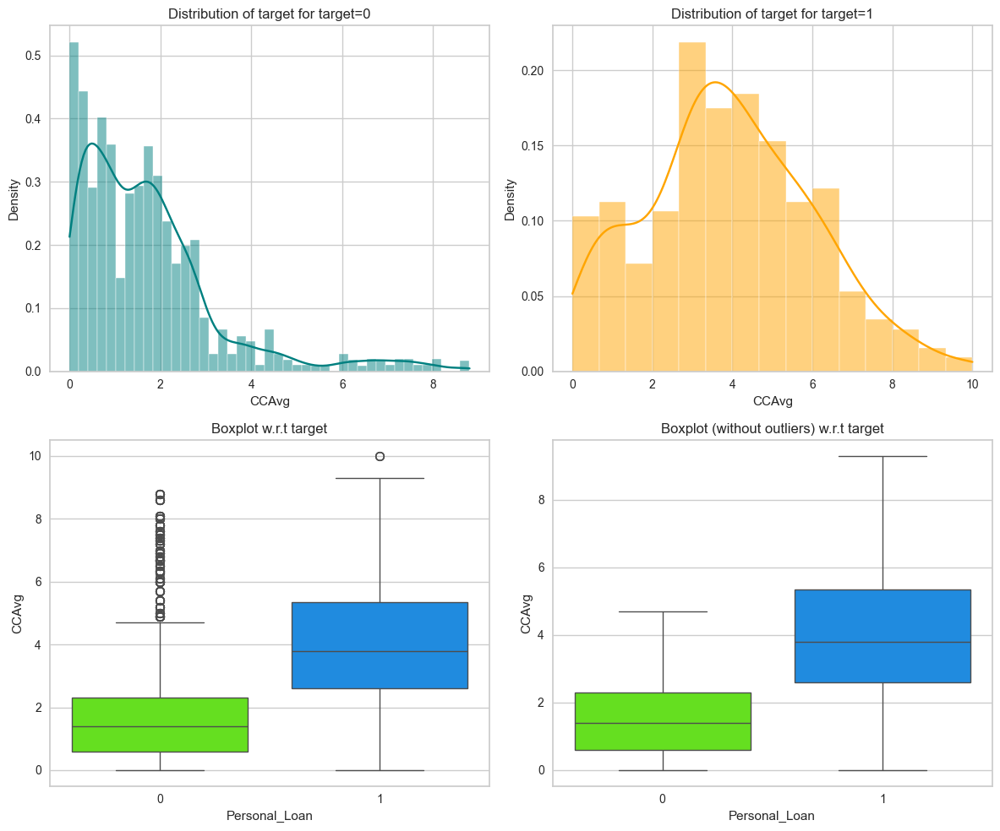

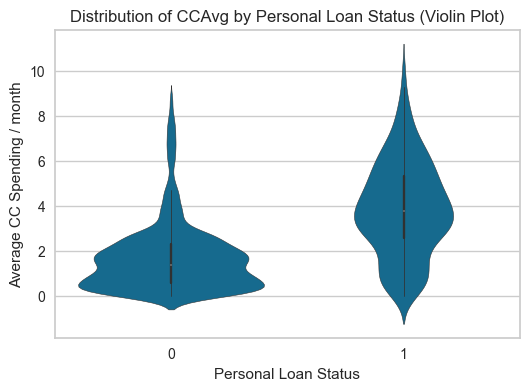

In [50]:
# Analysing the relationships between CCAvg and the target variable Personal_Loan

distribution_plot_wrt_target(df, "CCAvg", "Personal_Loan")

plt.figure(figsize=(6, 4))
sns.violinplot(x="Personal_Loan", y="CCAvg", data=df)
plt.title("Distribution of CCAvg by Personal Loan Status (Violin Plot)")
plt.xlabel("Personal Loan Status")
plt.ylabel("Average CC Spending / month")
plt.show()

#### Observations

* The boxplot observation is evidently showing a lot of outliers.
* The Credit Card Avg spending per month data is right skewed.
* Majority of the personal loan acceptance are from customers spending above 2K per month. This shows that customers 
  spending more than 2K on an average are most likely to accept personal loans.

#### Q5. How does a customer's interest in purchasing a loan vary with their education?

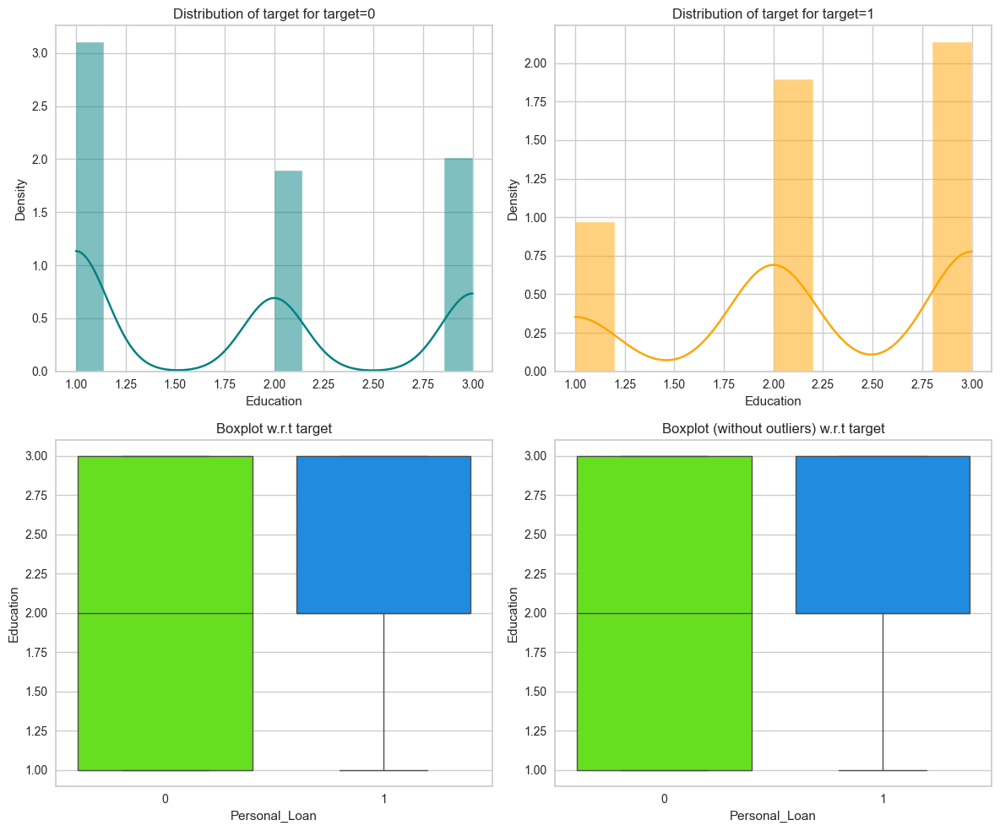

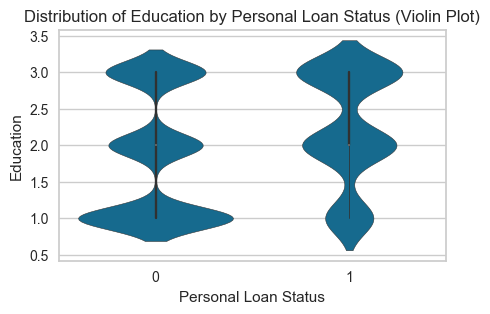

Personal_Loan     0    1   All
Education                     
All            4520  480  5000
3              1296  205  1501
2              1221  182  1403
1              2003   93  2096
------------------------------------------------------------------------------------------------------------------------


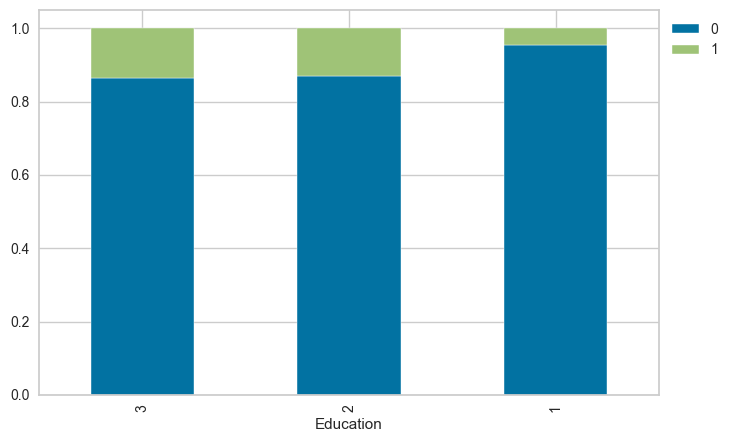

In [51]:
# Analysing the relationships between Education and the target variable Personal_Loan

distribution_plot_wrt_target(df, "Education", "Personal_Loan")

plt.figure(figsize=(5, 3))
sns.violinplot(x="Personal_Loan", y="Education", data=df)
plt.title("Distribution of Education by Personal Loan Status (Violin Plot)")
plt.xlabel("Personal Loan Status")
plt.ylabel("Education")
plt.show()

# Creating Stacked Barplot 
stacked_barplot(df, "Education", "Personal_Loan")

#### Observations - Ans to Q5

* The distribution shows 2096 - Undergrads ; 1403 - Graduates and 1501 - Advanced/Professionals
* The data is lightly right skewed.
* Majority of customers are Undergrads forming (41.9%) followed by Advanced/Professionals (30.0%).
* Observation from the Boxplot and the violinplot shows obvious dispersal of personal loans are to education category 2 or above. That means customers with education level of Graduates or above are tend to select personal loans.

##### Analysing the relationships between Mortgage and the target variable Personal_Loan

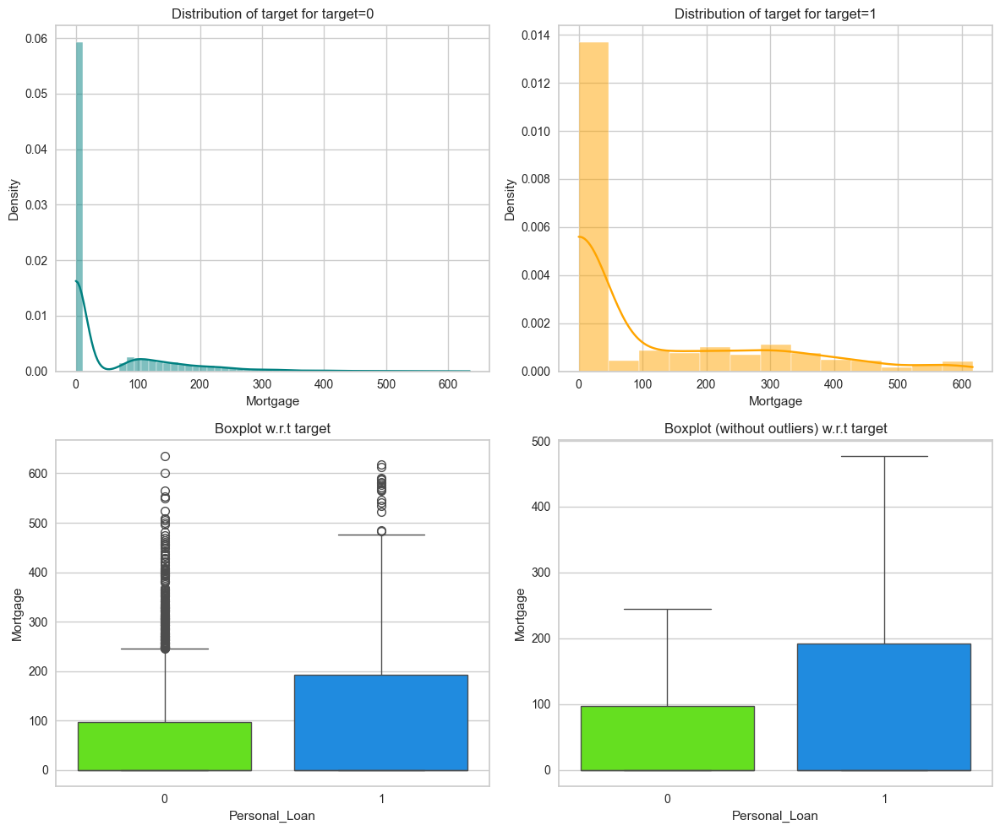

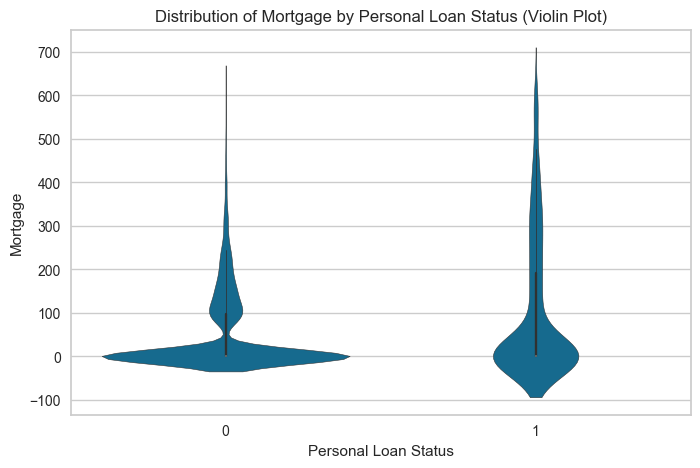

In [52]:
distribution_plot_wrt_target(df, "Mortgage", "Personal_Loan")

plt.figure(figsize=(8, 5))
sns.violinplot(x="Personal_Loan", y="Mortgage", data=df)
plt.title("Distribution of Mortgage by Personal Loan Status (Violin Plot)")
plt.xlabel("Personal Loan Status")
plt.ylabel("Mortgage")
plt.show()

#### Observations

* In the boxplot we observe significantly high outliers which should be analized for more details and be cleaned if necessary.
* The data is very highly right skewed.
* Customers mortgaged their houses are more likey to accept personal loans.

##### Analysing the relationships between Securities_Account and the target variable Personal_Loan

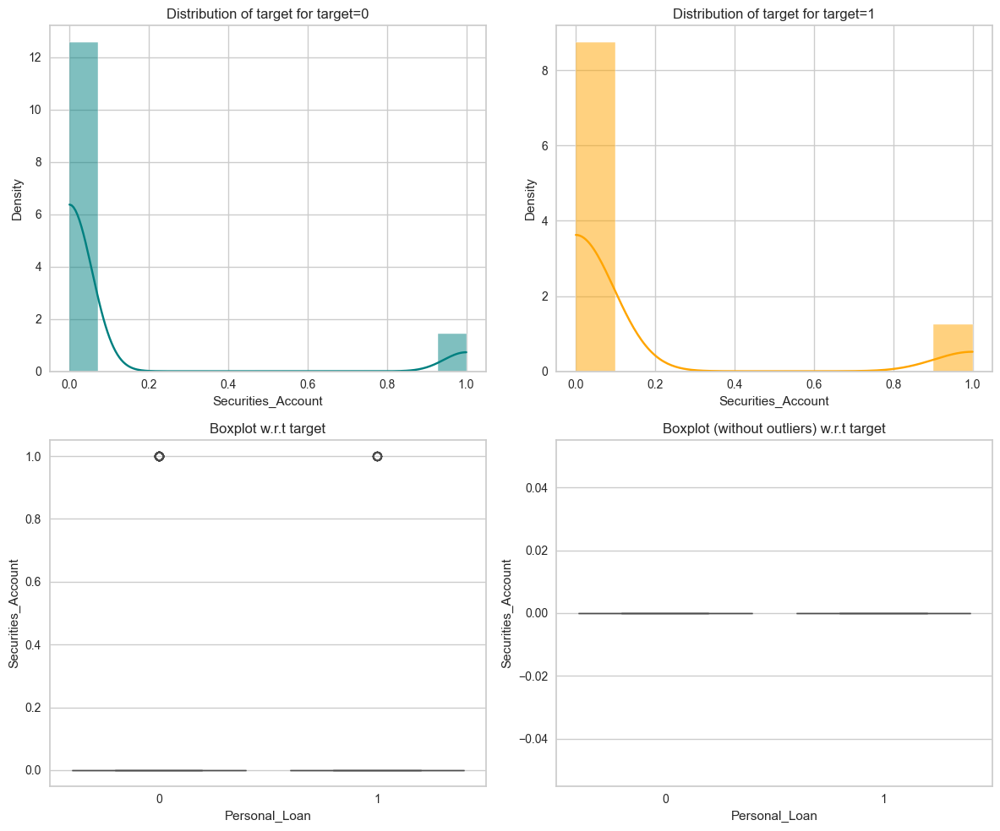

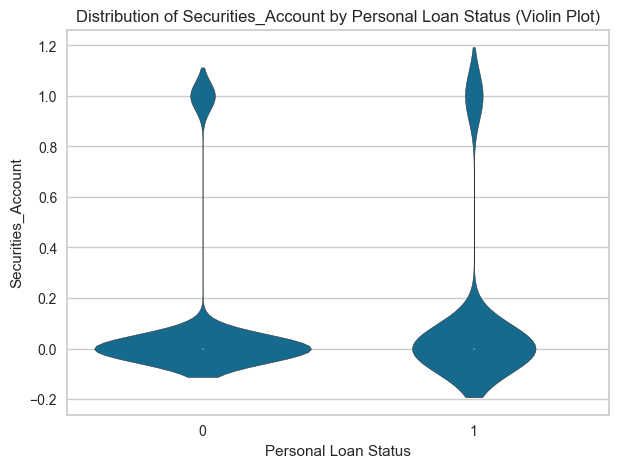

In [53]:
# Analysing the relationships between Securities_Account and the target variable Personal_Loan

distribution_plot_wrt_target(df, "Securities_Account", "Personal_Loan")

plt.figure(figsize=(7, 5))
sns.violinplot(x="Personal_Loan", y="Securities_Account", data=df)
plt.title("Distribution of Securities_Account by Personal Loan Status (Violin Plot)")
plt.xlabel("Personal Loan Status")
plt.ylabel("Securities_Account")
plt.show()

#### Observations

* No significant correlation is observed between Secuties Account and Personal loans.

#### Analysing the relationships between CD_Account and the target variable Personal_Loan

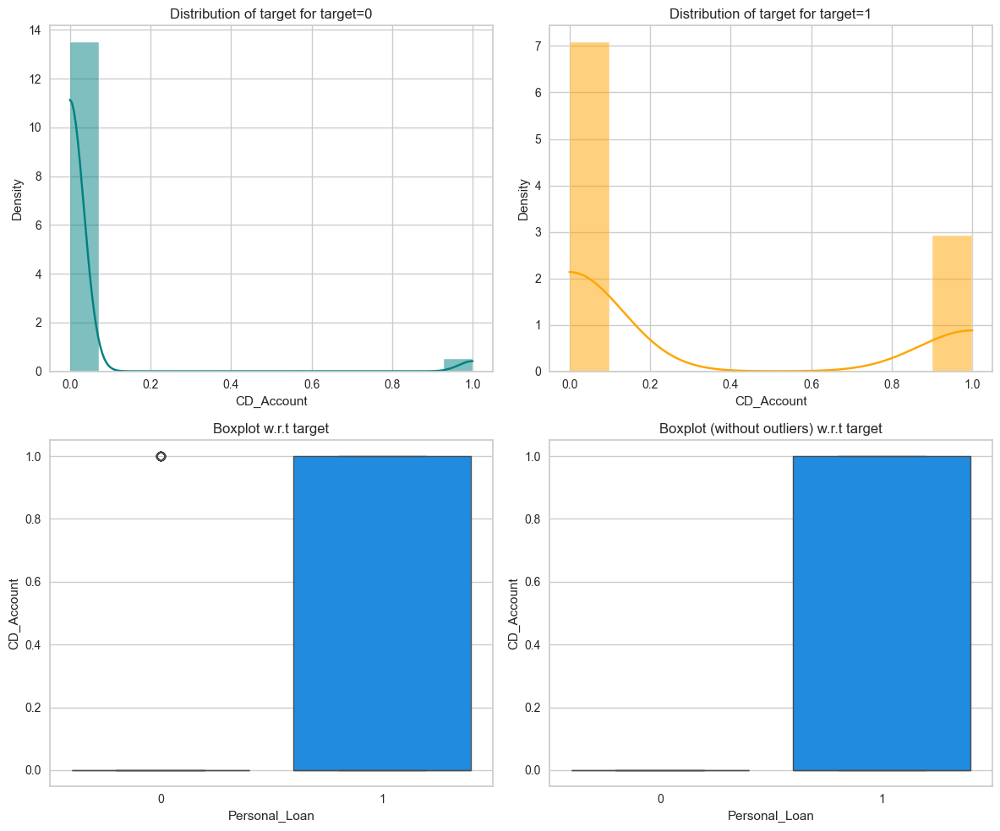

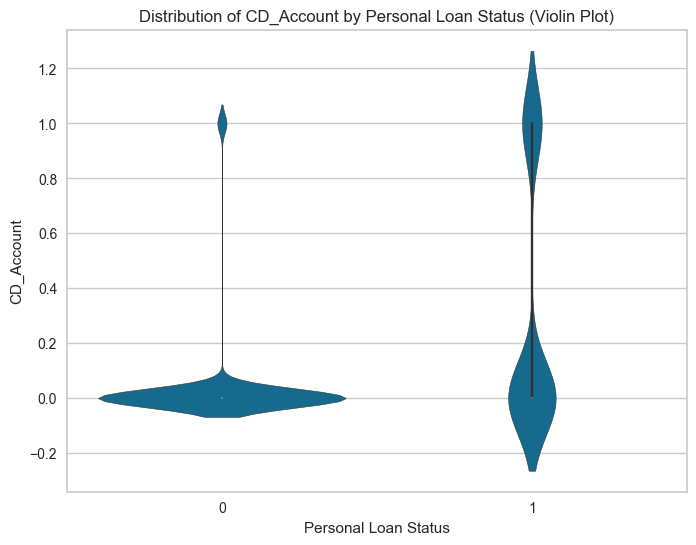

In [54]:
# Analysing the relationships between CD_Account and the target variable Personal_Loan


distribution_plot_wrt_target(df, "CD_Account", "Personal_Loan")

plt.figure(figsize=(8, 6))
sns.violinplot(x="Personal_Loan", y="CD_Account", data=df)
plt.title("Distribution of CD_Account by Personal Loan Status (Violin Plot)")
plt.xlabel("Personal Loan Status")
plt.ylabel("CD_Account")
plt.show()

#### Observations

* Almost all customers having certificate of deposit account with the bank is also having personal loans. This means all 
  the certificate of deposit account holders are prospects for personal loans.

#### Analysing the relationships between Online and the target variable Personal_Loan

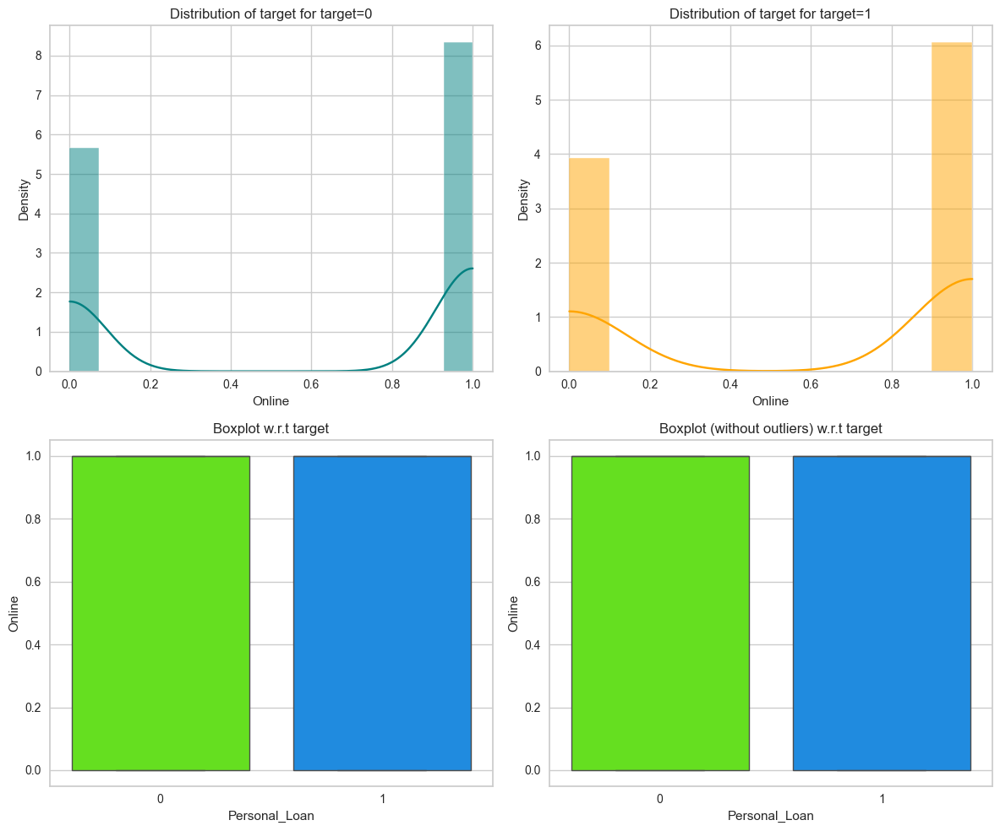

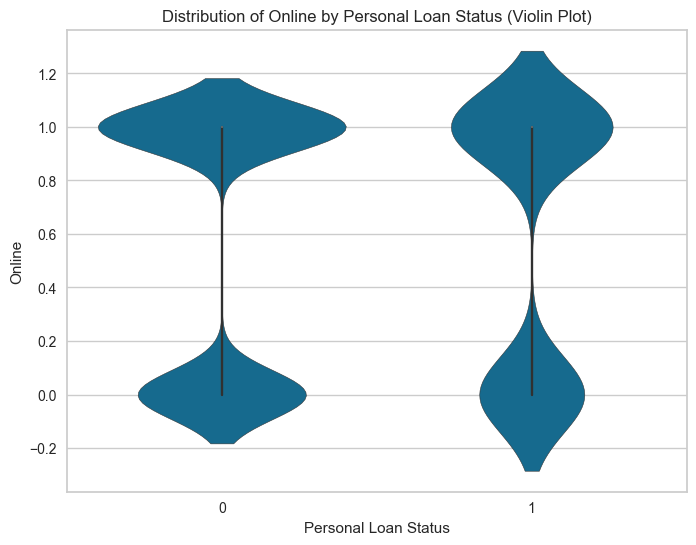

In [55]:
# Analysing the relationships between Online and the target variable Personal_Loan

distribution_plot_wrt_target(df, "Online", "Personal_Loan")

plt.figure(figsize=(8, 6))

sns.violinplot(x="Personal_Loan", y="Online", data=df)
plt.title("Distribution of Online by Personal Loan Status (Violin Plot)")
plt.xlabel("Personal Loan Status")
plt.ylabel("Online")
plt.show()

#### Observations

* Customers using internet banking facility is showing equal tendencies to have or not to have a personal loan.

#### Analysing the relationships between CreditCard and the target variable Personal_Loan

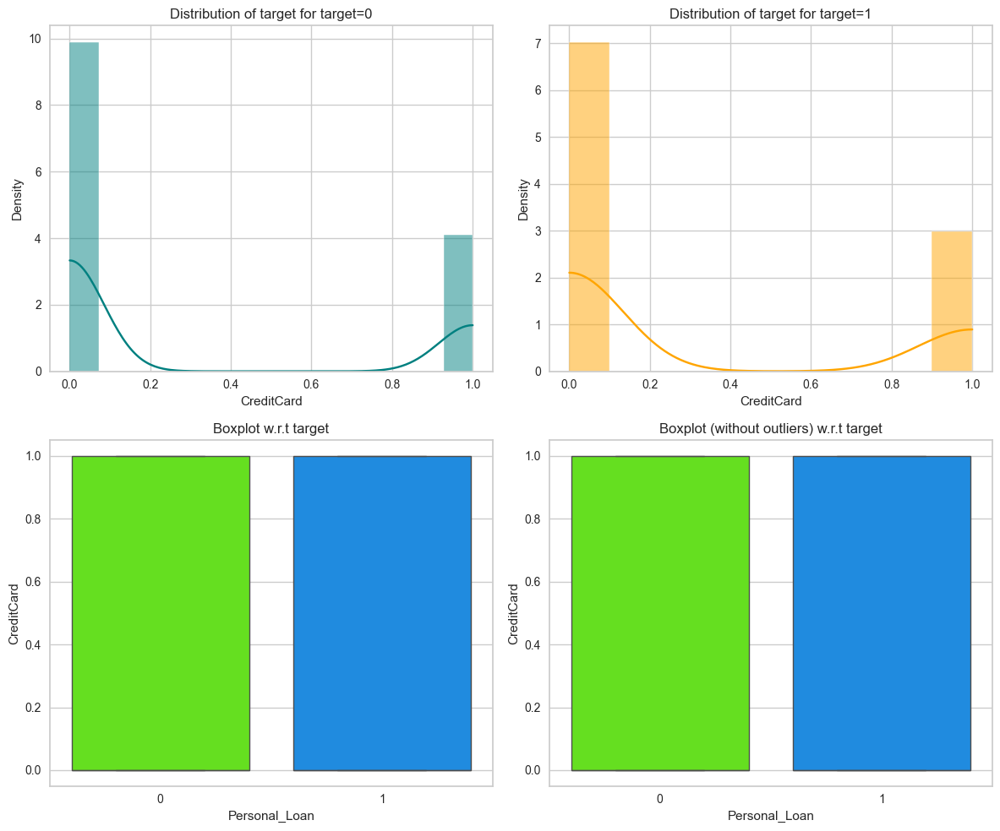

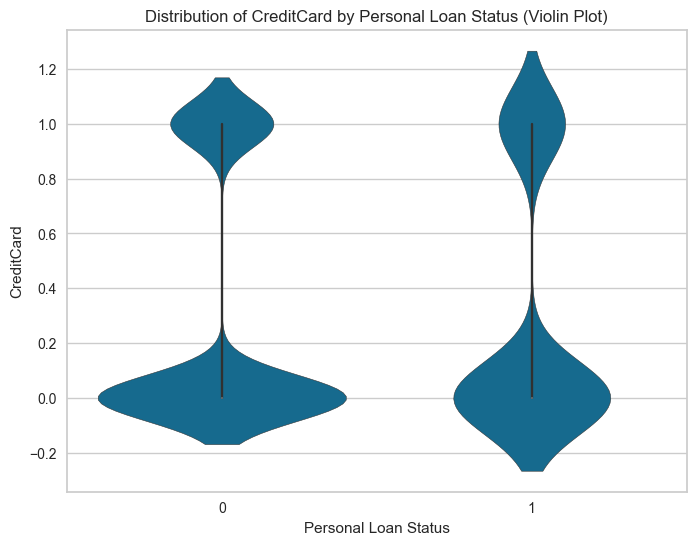

In [56]:
# Analysing the relationships between CreditCard and the target variable Personal_Loan

distribution_plot_wrt_target(df, "CreditCard", "Personal_Loan")

plt.figure(figsize=(8, 6))
sns.violinplot(x="Personal_Loan", y="CreditCard", data=df)
plt.title("Distribution of CreditCard by Personal Loan Status (Violin Plot)")
plt.xlabel("Personal Loan Status")
plt.ylabel("CreditCard")
plt.show()

#### Observations

* Customers using Credit Card with other banks are showing equal tendencies to have or not to have a personal loan.

## Data Preprocessing

* Missing value treatment
* Feature engineering (if needed)
* Outlier detection and treatment (if needed)
* Preparing data for modeling
* Any other preprocessing steps (if needed)

#### Actions for data pre-processing:

* Experience data is having -ve values 
* We can drop ID and, ZIPCode as most of the observations has no significance for these variables.mortgage
* Many variables are observed to have Outliers, they have to be identified and treated.

##### Missing value treatment 

In [57]:
# We have found 52 (-ve entries)  having error in the variable Experience, since the number of rows are few
# we shall impute/ replace it with the median value.
df_ml = data.copy()
median_value = df_ml[df_ml['Experience'] > 0]['Experience'].median()  # Find the median value of values above zero

# Replace all -ve values with median value
df_ml['Experience'] = df_ml['Experience'].apply(lambda x : median_value if x < 0 else x) 


In [58]:
# ID and ZIPCode columns found no significance in our EDA so can be removed.

df_ml.drop(["ID", "ZIPCode"], axis=1, inplace=True)

#### Detecting Outliers

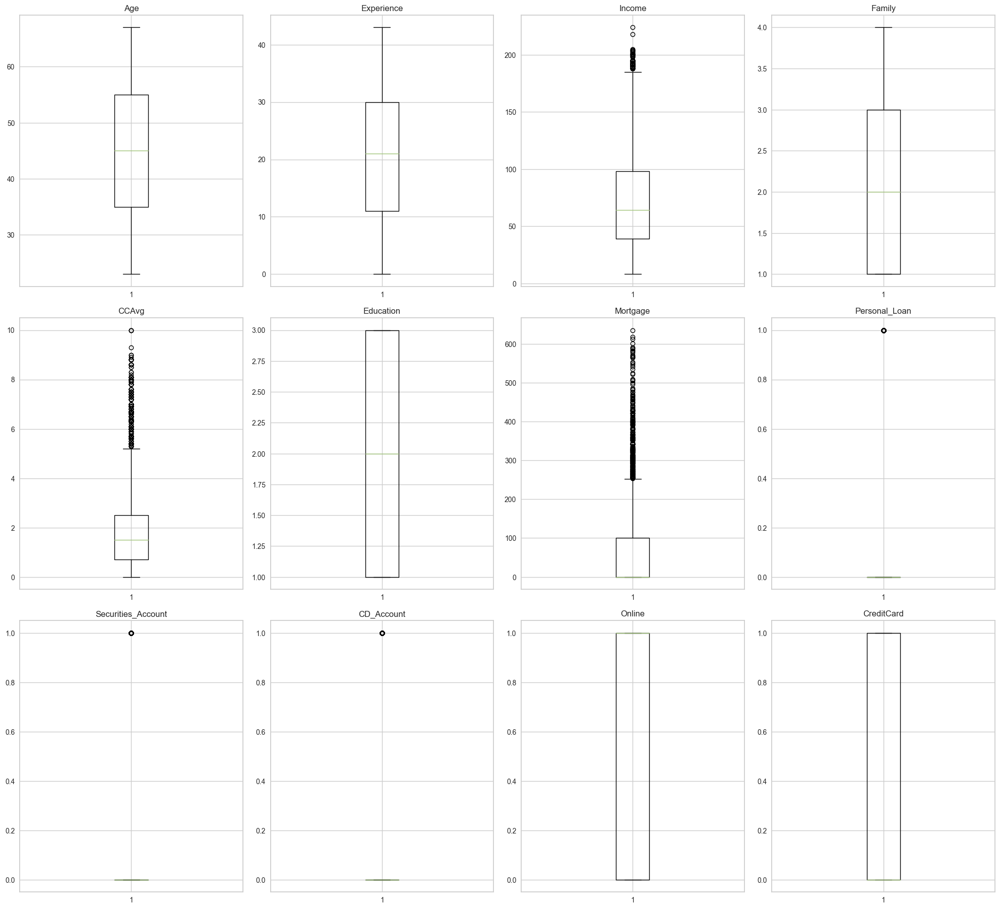

In [59]:
numerical_col = df_ml.select_dtypes(include=np.number).columns.tolist()
plt.figure(figsize=(20, 30))

for i, variable in enumerate(numerical_col):
    plt.subplot(5, 4, i + 1)
    plt.boxplot(df_ml[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

#### Observations

* Income, CCAvg and, Mortgage are having upper outliers that need to be treated.

#### Treating Outliers

In [60]:
# functions to treat outliers by flooring and capping


def treat_outliers(df, col):
    """
    Treats outliers in a variable

    df: dataframe
    col: dataframe column
    """
    Q1 = df[col].quantile(0.25)  # 25th quantile
    Q3 = df[col].quantile(0.75)  # 75th quantile
    IQR = Q3 - Q1
    Lower_Whisker = Q1 - 1.5 * IQR
    Upper_Whisker = Q3 + 1.5 * IQR

    # all the values smaller than Lower_Whisker will be assigned the value of Lower_Whisker
    # all the values greater than Upper_Whisker will be assigned the value of Upper_Whisker
    df[col] = np.clip(df[col], Lower_Whisker, Upper_Whisker)

    return df


def treat_outliers_all(df, col_list):
    """
    Treat outliers in a list of variables

    df: dataframe
    col_list: list of dataframe columns
    """
    for c in col_list:
        df = treat_outliers(df, c)

    return df

In [61]:
# Treating outliers are affecting the regression, because some data are critical values.
#numerical_col = df_ml.select_dtypes(include=np.number).columns.tolist()
#df_ml = treat_outliers_all(df_ml, numerical_col)

#### Observations

*  There are quite a few outliers in the data.
*  However, we will not treat them as they are proper values

#### Preparing Data for Model Making

##### Creating training and test sets.

In [62]:
# specifying the independent  and dependent variables
#df_ml = data.copy()
X = df_ml.drop(["Personal_Loan"], axis=1)
Y = df_ml["Personal_Loan"]

# adding a constant to the independent variables
X = sm.add_constant(X)

# creating dummy variables
X = pd.get_dummies(X, drop_first=True)

# splitting data in train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.30, random_state=1
)



In [63]:
print("Shape of Training set : ", X_train.shape)
print("Shape of test set : ", X_test.shape)
print("Percentage of classes in training set:")
print(y_train.value_counts(normalize=True))
print("Percentage of classes in test set:")
print(y_test.value_counts(normalize=True))

Shape of Training set :  (3500, 12)
Shape of test set :  (1500, 12)
Percentage of classes in training set:
0    0.905429
1    0.094571
Name: Personal_Loan, dtype: float64
Percentage of classes in test set:
0    0.900667
1    0.099333
Name: Personal_Loan, dtype: float64


#### Selection of model  evaluation criteria depends on the type of loss that may occur on wrong selection.

* Our objective is to predict whether a liability customer will buy personal loans or not.
   Prediction possibilities:
   * 1. that a customer will buy and they are buying it - TP
   * 2. that a customer will buy and they are not buying it - FP
   * 3. that a customer will not buy and they are not buying it - TN
   * 4. that a customer will not buy and they are buying it - FN
      
   Here the chances of loss are cases 2 and 4. Now we must see the real magnitude and type of loss from these cases.
   
  * Case 2 - FP is a resource loss that bank spend on man power and marketing.
  * Case 4 - FN is an opportunity loss that bank did not market well so a possibility that customer may buy loan from 
   some other bank, that may lead to a revenue loss and may lose the customer. 
   
* How to reduce this loss?

   We need to reduce both False Negatives and False Positives
   
   Opportunity loss is the greatese loss for bank and can be reduced only by reduction of (FN) False Negatives in our model
   that can be achieved by improving the Recall.
   
   f1_score should be maximized as the greater the f1_score, the higher the chances of reducing both False Negatives and False
   Positives and identifying both the classes correctly



## Model Building - Logistic Regression

In [64]:
# fitting logistic regression model
logit = sm.Logit(y_train, X_train.astype(float))
lg = logit.fit(disp=False)

print(lg.summary())

                           Logit Regression Results                           
Dep. Variable:          Personal_Loan   No. Observations:                 3500
Model:                          Logit   Df Residuals:                     3488
Method:                           MLE   Df Model:                           11
Date:                Sat, 25 May 2024   Pseudo R-squ.:                  0.6039
Time:                        11:10:04   Log-Likelihood:                -433.93
converged:                       True   LL-Null:                       -1095.5
Covariance Type:            nonrobust   LLR p-value:                4.743e-277
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                -15.4104      1.300    -11.852      0.000     -17.959     -12.862
Age                    0.0701      0.040      1.748      0.080      -0.009       0.149
Experience          

#### Observations

* Negative values of the coefficient show that the probability of a customer buying the personal loan decreases 
  with increase of the corresponding attribute value.

* Positive values of the coefficient show that the probability of a customer buying the personal loan increases 
  with increase of the corresponding attribute value.

* p-value of a variable indicates if the variable is significant or not. If we consider the significance level to be 0.05 (5%),
  then any variable with a p-value less than 0.05 would be considered significant. 'Age', 'Experience' and 'Mortgage' are very
  significant.

#### Model Performance Evaluation

Creating the functions to calculate different metrics and confusion matrix so that we don't have to use the same code repeatedly for each model.


In [65]:
# defining a function to compute different metrics to check performance of a classification model built using statsmodels
def model_performance_classification_statsmodels(
    model, predictors, target, threshold=0.5
):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """

    # checking which probabilities are greater than threshold
    pred_temp = model.predict(predictors) > threshold
    # rounding off the above values to get classes
    pred = np.round(pred_temp)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

In [66]:
# defining a function to plot the confusion_matrix of a classification model


def confusion_matrix_statsmodels(model, predictors, target, threshold=0.5):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """
    y_pred = model.predict(predictors) > threshold
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

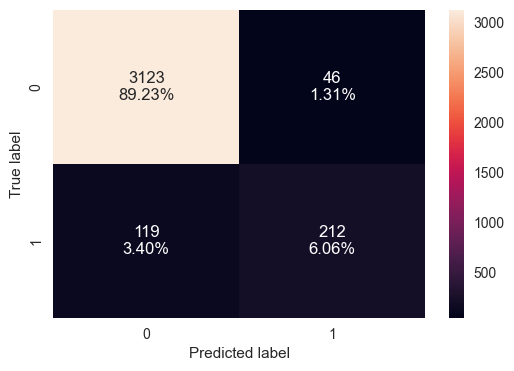

In [67]:
confusion_matrix_statsmodels(lg, X_train, y_train)

In [68]:
print("Training performance:")
model_performance_classification_statsmodels(lg, X_train, y_train)

Training performance:


,Accuracy,Recall,Precision,F1
0,0.952857,0.640483,0.821705,0.719864


#### Observations

* The f1_score of the model is ~0.72 and we will try to maximize it further

* The variables used to build the model might contain multicollinearity, which will affect the p-values

* We will have to remove multicollinearity from the data to get reliable coefficients and p-values


#### Detecting and Dealing with Multicollinearity

In [69]:
vif_series = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
    dtype=float,
)
print("Series before feature selection: \n\n{}\n".format(vif_series))

Series before feature selection: 

const                 110.838071
Age                    18.988274
Experience             18.959148
Income                  1.868964
Family                  1.031561
CCAvg                   1.734753
Education               1.053839
Mortgage                1.046064
Securities_Account      1.144323
CD_Account              1.355462
Online                  1.040733
CreditCard              1.109173
dtype: float64



#### Observations

* Age, and Experience exhibit high multicollinearity


In [70]:
X_train1 = X_train.drop("Age", axis=1)

vif_series2 = pd.Series(
    [variance_inflation_factor(X_train1.values, i) for i in range(X_train1.shape[1])],
    index=X_train1.columns,
)
print("Series before feature selection: \n\n{}\n".format(vif_series2))

Series before feature selection: 

const                 22.291039
Experience             1.008377
Income                 1.868361
Family                 1.030837
CCAvg                  1.734722
Education              1.047103
Mortgage               1.046051
Securities_Account     1.144097
CD_Account             1.354821
Online                 1.040724
CreditCard             1.109141
dtype: float64



In [71]:
logit1 = sm.Logit(y_train, X_train1.astype(float))
lg1 = logit1.fit(disp=False)

print("Training performance:")
model_performance_classification_statsmodels(lg1, X_train1, y_train)

Training performance:


,Accuracy,Recall,Precision,F1
0,0.952857,0.643505,0.819231,0.720812


##### No significant change in the model performance.


#### Observations:

* Dropping Age, doesn't have a significant impact on the model performance or F1 Score.
* We can choose any model to proceed to the next steps.
* So, we choose to move with the first regression model without dropping the 'Age'

In [72]:
print(lg1.summary())

                           Logit Regression Results                           
Dep. Variable:          Personal_Loan   No. Observations:                 3500
Model:                          Logit   Df Residuals:                     3489
Method:                           MLE   Df Model:                           10
Date:                Sat, 25 May 2024   Pseudo R-squ.:                  0.6022
Time:                        11:10:05   Log-Likelihood:                -435.80
converged:                       True   LL-Null:                       -1095.5
Covariance Type:            nonrobust   LLR p-value:                2.597e-277
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                -13.5406      0.731    -18.517      0.000     -14.974     -12.107
Experience             0.0015      0.008      0.190      0.849      -0.014       0.017
Income              

#### Since no significant performance change, we choose to move with the first regression model without dropping the 'Age'

In [73]:
print(lg.summary())

                           Logit Regression Results                           
Dep. Variable:          Personal_Loan   No. Observations:                 3500
Model:                          Logit   Df Residuals:                     3488
Method:                           MLE   Df Model:                           11
Date:                Sat, 25 May 2024   Pseudo R-squ.:                  0.6039
Time:                        11:10:05   Log-Likelihood:                -433.93
converged:                       True   LL-Null:                       -1095.5
Covariance Type:            nonrobust   LLR p-value:                4.743e-277
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                -15.4104      1.300    -11.852      0.000     -17.959     -12.862
Age                    0.0701      0.040      1.748      0.080      -0.009       0.149
Experience          

### Coefficient Interpretations

*  Coefficient of some valuies of Age, Income, Family, CCAvg, Education, Mortgage, and CD_Account are positive an increase 
   in these will lead to increase in chances of a customer buying the Personal loan.

*  Coefficient of Experience, Securities_Account, Online, and  Other bank 'CreditCard' are negative, increase in these will lead to 
   decrease in chances of a person buying the Personal loan.

### Converting coefficients to odds

In [74]:
# converting coefficients to odds
odds = np.exp(lg.params)

# finding the percentage change
perc_change_odds = (np.exp(lg.params) - 1) * 100

# removing limit from number of columns to display
pd.set_option("display.max_columns", None)

# adding the odds to a dataframe
pd.DataFrame({"Odds": odds, "Change_odd%": perc_change_odds}, index=X_train.columns).T

,const,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities_Account,CD_Account,Online,CreditCard
Odds,2.029223e-07,1.072638,0.934581,1.055664,2.096279,1.181852,5.556419,1.000778,0.302861,48.096773,0.533821,0.316754
Change_odd%,-9.999998e+01,7.263790,-6.541943,5.566358,109.627866,18.185245,455.641935,0.077848,-69.713922,4709.677329,-46.617868,-68.324632


### Coefficient interpretations

* Age: Holding all other features constant a 1 unit change in Age will increase the odds of a customer buying personal loan 
  by ~1.07 times or a ~7.26% increase in the odds.
* Experience: Holding all other features constant a 1 unit change in the Experience will decrease the odds of a customer buying
  personal loan by ~0.94 times or a decrease of ~ 6.3% in odds.
* Income: Holding all other features constant a 1 unit change in Income will increase the odds of a customer buying personal
  loan by ~1.06 times or a ~5.57 % increase in the odds.
* Family: Holding all other features constant a 1 unit change in Family will increase the odds of a customer buying personal
  loan by ~2.09 times or a ~109.6 % increase in the odds.
* CCAvg: Holding all other features constant a 1 unit change in CCAvg will increase the odds of a customer buying personal
  loan by ~1.18 times or a ~18.18 % increase in the odds.
* Education: Holding all other features constant a 1 unit change in Education will increase the odds of a customer buying
  personal loan by ~5.55 times or a ~455.64 % increase in the odds.
* Mortgage: Holding all other features constant a 1 unit change in Mortgage will increase the odds of a customer buying personal
  loan by ~1.00 times or a ~0.08 % increase in the odds.
* Securities_Account: Holding all other features constant a 1 unit change in the Securities_Account will decrease the odds of a 
  customer buying personal loan by ~0.31 times or a decrease of ~ 69.71% in odds.
* CD_Account: Holding all other features constant a 1 unit change in CD_Account will increase the odds of a customer buying
  personal loan by ~48.09 times or a ~4709.66 % increase in the odds.
* Online: Holding all other features constant a 1 unit change in the Online will decrease the odds of a customer buying personal
  loan by ~0.53 times or a decrease of ~ 46.62% in odds.
* CreditCard: Holding all other features constant a 1 unit change in the CreditCard will decrease the odds of a customer 
  buying personal loan by ~0.32 times or a decrease of ~ 68.32% in odds.

### Model Train set performance

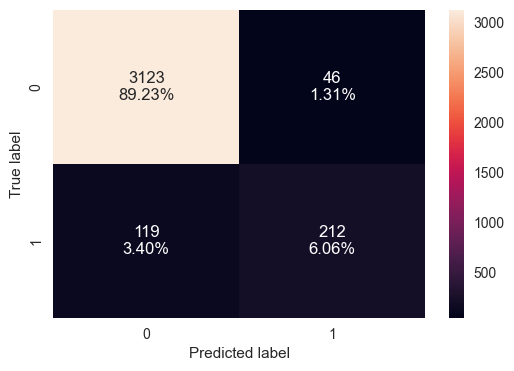

In [75]:
confusion_matrix_statsmodels(lg, X_train, y_train)

### Model Test set performance

* We are using the same first model with 'Age' for test.

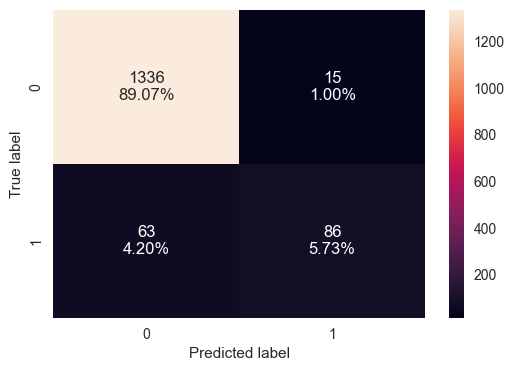

In [76]:
# creating confusion matrix for test
confusion_matrix_statsmodels(lg, X_test, y_test)

In [77]:
log_reg_model_test_perf = model_performance_classification_statsmodels(
    lg, X_test, y_test
)

print("Test performance:")
log_reg_model_test_perf

Test performance:


,Accuracy,Recall,Precision,F1
0,0.948,0.577181,0.851485,0.688


#### Observations

* The model is giving a good f1_score of ~0.72 and ~0.688 on the train and test sets respectively
* As the train and test performances are comparable, the model is not overfitting
* Moving forward we will try to improve the performance of the model

### ROC Curve and ROC-AUC

ROC-AUC on training set

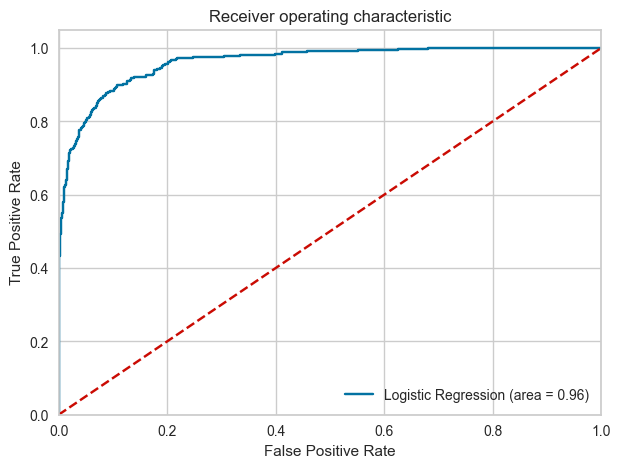

In [78]:
logit_roc_auc_train = roc_auc_score(y_train, lg.predict(X_train))
fpr, tpr, thresholds = roc_curve(y_train, lg.predict(X_train))
plt.figure(figsize=(7, 5))
plt.plot(fpr, tpr, label="Logistic Regression (area = %0.2f)" % logit_roc_auc_train)
plt.plot([0, 1], [0, 1], "r--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend(loc="lower right")
plt.show()

##### Logistic Regression model is giving a good performance on training set.


#### Optimal threshold using AUC-ROC curve




In [79]:
# Optimal threshold as per AUC-ROC curve
# The optimal cut off would be where tpr is high and fpr is low
fpr, tpr, thresholds = roc_curve(y_train, lg.predict(X_train))

optimal_idx = np.argmax(tpr - fpr)
optimal_threshold_auc_roc = thresholds[optimal_idx]
print(optimal_threshold_auc_roc)

0.09442239131738578


#### Checking model performance on training set

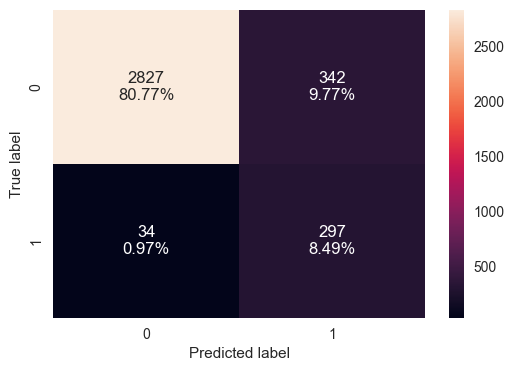

In [80]:
# creating confusion matrix
confusion_matrix_statsmodels(
    lg, X_train, y_train, threshold=optimal_threshold_auc_roc
)

In [81]:
# checking model performance for this new model
log_reg_model_train_perf_threshold_auc_roc = model_performance_classification_statsmodels(
    lg, X_train, y_train, threshold=optimal_threshold_auc_roc
)
print("Training performance:")
log_reg_model_train_perf_threshold_auc_roc

Training performance:


,Accuracy,Recall,Precision,F1
0,0.892571,0.897281,0.464789,0.612371



* The model is performing well on the training set with an AUC of 0.89.
* The recall increased from  at 89.7% but precision reduced to 0.46% we can see if this can be improved further


#### Checking model performance on test set

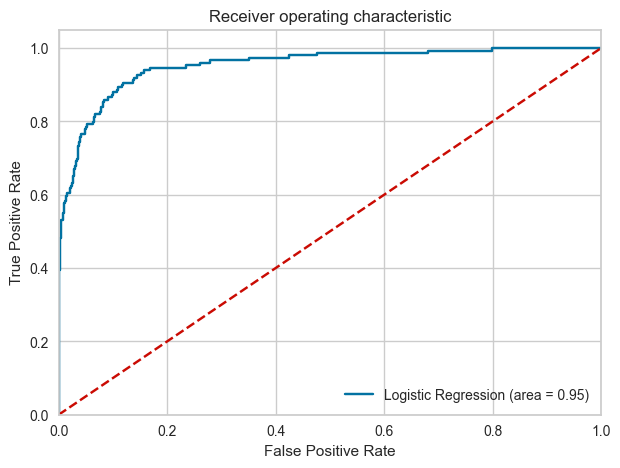

In [82]:
logit_roc_auc_train = roc_auc_score(y_test, lg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, lg.predict(X_test))
plt.figure(figsize=(7, 5))
plt.plot(fpr, tpr, label="Logistic Regression (area = %0.2f)" % logit_roc_auc_train)
plt.plot([0, 1], [0, 1], "r--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend(loc="lower right")
plt.show()

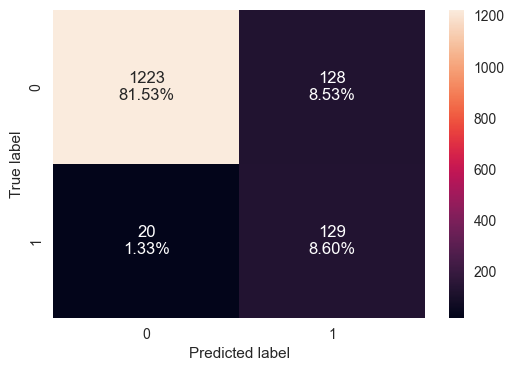

In [83]:
# creating confusion matrix
confusion_matrix_statsmodels(lg, X_test, y_test, threshold=optimal_threshold_auc_roc)

In [84]:
# checking model performance for this model
log_reg_model_test_perf_threshold_auc_roc = model_performance_classification_statsmodels(
    lg, X_test, y_test, threshold=optimal_threshold_auc_roc
)
print("Test performance:")
log_reg_model_test_perf_threshold_auc_roc

Test performance:


,Accuracy,Recall,Precision,F1
0,0.901333,0.865772,0.501946,0.635468


#### Checking the Model Performance on Training Set with default threshold of 0.5

#### Precision-Recall Curve 

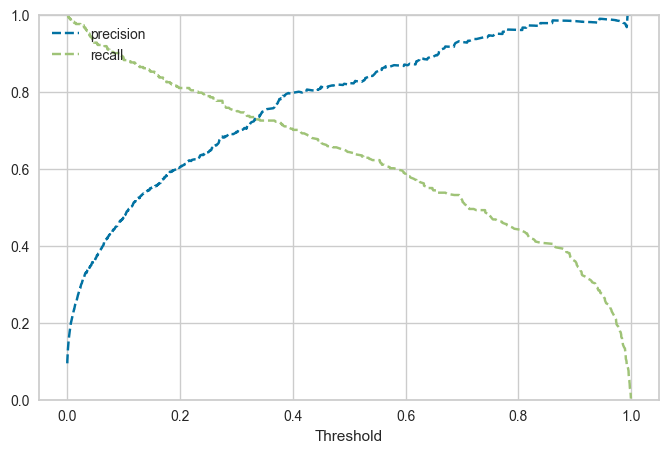

In [85]:
y_scores = lg.predict(X_train)
prec, rec, tre = precision_recall_curve(y_train, y_scores,)


def plot_prec_recall_vs_tresh(precisions, recalls, thresholds):
    plt.plot(thresholds, precisions[:-1], "b--", label="precision")
    plt.plot(thresholds, recalls[:-1], "g--", label="recall")
    plt.xlabel("Threshold")
    plt.legend(loc="upper left")
    plt.ylim([0, 1])


plt.figure(figsize=(8, 5))
plot_prec_recall_vs_tresh(prec, rec, tre)
plt.show()





In [86]:
# setting the threshold
optimal_threshold_curve = 0.36

##### Checking model performance on training set

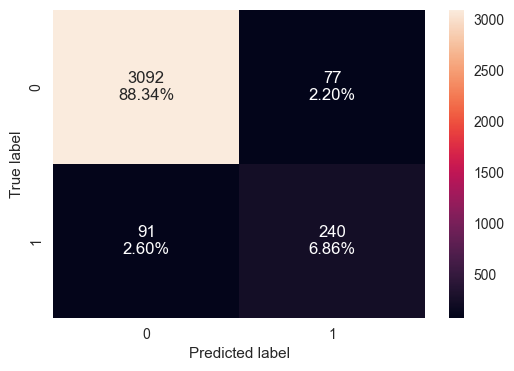

In [87]:
# creating confusion matrix
confusion_matrix_statsmodels(lg, X_train, y_train, threshold=optimal_threshold_curve)

In [88]:
log_reg_model_train_perf_threshold_curve = model_performance_classification_statsmodels(
    lg, X_train, y_train, threshold=optimal_threshold_curve
)
print("Training performance:")
log_reg_model_train_perf_threshold_curve

Training performance:


,Accuracy,Recall,Precision,F1
0,0.952,0.725076,0.757098,0.740741


# Model Building

### Decision Tree - Model

In [89]:
df_dt=df_ml.copy()
oneHotCols=['Education'] # One hot encoding for Education
df_dt=pd.get_dummies(df_dt,columns=oneHotCols,drop_first=True)
df_dt


,Age,Experience,Income,Family,CCAvg,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,Education_2,Education_3
0,25,1.0,49,4,1.6,0,0,1,0,0,0,0,0
1,45,19.0,34,3,1.5,0,0,1,0,0,0,0,0
2,39,15.0,11,1,1.0,0,0,0,0,0,0,0,0
3,35,9.0,100,1,2.7,0,0,0,0,0,0,1,0
4,35,8.0,45,4,1.0,0,0,0,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,29,3.0,40,1,1.9,0,0,0,0,1,0,0,1
4996,30,4.0,15,4,0.4,85,0,0,0,1,0,0,0
4997,63,39.0,24,2,0.3,0,0,0,0,0,0,0,1
4998,65,40.0,49,3,0.5,0,0,0,0,1,0,1,0


In [90]:
target_col = ["Personal_Loan"]
col_names = list(df_dt.columns)
stdsclr= StandardScaler()

col_names = list(df_dt.columns)
col_names.remove("Personal_Loan")

scaled = stdsclr .fit_transform(df_dt[col_names])
scaled = pd.DataFrame(scaled, columns=col_names)

df_dt = pd.concat([scaled, df_dt[target_col]], axis=1)

df_dt.head()

,Age,Experience,Income,Family,CCAvg,Mortgage,Securities_Account,CD_Account,Online,CreditCard,Education_2,Education_3,Personal_Loan
0,-1.774417,-1.718618,-0.538229,1.397414,-0.193385,-0.555524,2.928915,-0.25354,-1.216618,-0.645314,-0.624538,-0.654965,0
1,-0.029524,-0.118912,-0.864109,0.525991,-0.250611,-0.555524,2.928915,-0.25354,-1.216618,-0.645314,-0.624538,-0.654965,0
2,-0.552992,-0.474402,-1.363793,-1.216855,-0.536736,-0.555524,-0.341423,-0.25354,-1.216618,-0.645314,-0.624538,-0.654965,0
3,-0.901970,-1.007637,0.569765,-1.216855,0.436091,-0.555524,-0.341423,-0.25354,-1.216618,-0.645314,1.601185,-0.654965,0
4,-0.901970,-1.096510,-0.625130,1.397414,-0.536736,-0.555524,-0.341423,-0.25354,-1.216618,1.549632,1.601185,-0.654965,0


In [91]:
df_dt.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,5000.0,-2.131628e-18,1.000100,-1.948906,-0.901970,-0.029524,0.842923,1.889859
Experience,5000.0,-9.308110e-17,1.000100,-1.807491,-0.829892,0.058834,0.858687,2.014030
Income,5000.0,1.449507e-16,1.000100,-1.428969,-0.755483,-0.212348,0.526315,3.263712
Family,5000.0,1.001865e-16,1.000100,-1.216855,-1.216855,-0.345432,0.525991,1.397414
CCAvg,5000.0,-6.394885e-17,1.000100,-1.108987,-0.708412,-0.250611,0.321641,4.613525
Mortgage,5000.0,-5.613288e-17,1.000100,-0.555524,-0.555524,-0.555524,0.437558,5.688108
Securities_Account,5000.0,-2.273737e-17,1.000100,-0.341423,-0.341423,-0.341423,-0.341423,2.928915
CD_Account,5000.0,2.131628e-17,1.000100,-0.253540,-0.253540,-0.253540,-0.253540,3.944146
Online,5000.0,4.121148e-17,1.000100,-1.216618,-1.216618,0.821951,0.821951,0.821951
CreditCard,5000.0,7.105427e-18,1.000100,-0.645314,-0.645314,-0.645314,1.549632,1.549632


In [92]:
confusion_matrix_all= {}

def loan_prediction(name, algor, x_train, x_test, y_train, y_test, plot) :
    algor.fit(x_train,y_train)
    predictions = algor.predict(x_test)
    probabilities = algor.predict_proba(x_test)
    conf_matrix = confusion_matrix(y_test, predictions)
    tn, fp, fn, tp = conf_matrix.ravel()
    confusion_matrix_all[name] = conf_matrix
    print("Classification report:")
    print(classification_report(y_test, predictions))
  
    roc_auc = roc_auc_score(y_test, predictions)
    fpr,tpr,thresholds = roc_curve(y_test, probabilities[:,1])

    print ("Area under the curve: ", roc_auc)

        
    if plot:
        fig, axes = plt.subplots(1,2, figsize=(15, 5))
        conf_matrix = np.flip(conf_matrix)

        labels = np.array([['\nTP','\nFN'],['\nFP','\nTN']])
        labels = np.core.defchararray.add(conf_matrix.astype(str), labels)
        sns.heatmap(conf_matrix, fmt='', annot = labels, ax=axes[0], cmap="YlGnBu", xticklabels=[1, 0], yticklabels=[1, 0]);
        axes[0].set(xlabel='Predicted', ylabel='Actual')

        plt.title('ROC - Receiver Operating Characteristic')
        sns.lineplot(x=fpr, y=tpr, ax=axes[1])
        sns.lineplot()
        plt.plot([0, 1], [0, 1],'--')
        axes[1].set_xlim([0, 1])
        axes[1].set_ylim([0, 1])
        axes[1].set(xlabel = 'FP Rate', ylabel = 'TP Rate');

        plt.show();

In [93]:
X_dt = df_dt.drop('Personal_Loan', axis=1)
y_dt = df_dt['Personal_Loan']

oneHotCols=X_dt.select_dtypes(exclude='number').columns.to_list()

X_dt=pd.get_dummies(X_dt,columns=oneHotCols,drop_first=True)
# Spliting data set
#X_train_dt, X_test_dt, y_train_dt, y_test_dt = train_test_split(X_dt, y_dt, test_size=0.30, random_state=1, stratify=y_dt)
X_train, X_test, y_train, y_test = train_test_split(X_dt, y_dt, test_size=0.30, random_state=1, stratify=y_dt)
print("Shape of Training set : ", X_train.shape)
print("Shape of test set : ", X_test.shape)
print("Percentage of classes in training set:")
print(y_train.value_counts(normalize=True))
print("Percentage of classes in test set:")
print(y_test.value_counts(normalize=True))

Shape of Training set :  (3500, 12)
Shape of test set :  (1500, 12)
Percentage of classes in training set:
0    0.904
1    0.096
Name: Personal_Loan, dtype: float64
Percentage of classes in test set:
0    0.904
1    0.096
Name: Personal_Loan, dtype: float64


##### We had seen that around 90.5% of observations belongs to class 0 (Not Failed) and 9.5% observations belongs to class 1 (Failed), and this is preserved in the train and test sets 

Classification report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1356
           1       0.93      0.86      0.89       144

    accuracy                           0.98      1500
   macro avg       0.96      0.93      0.94      1500
weighted avg       0.98      0.98      0.98      1500

Area under the curve:  0.9268682399213373


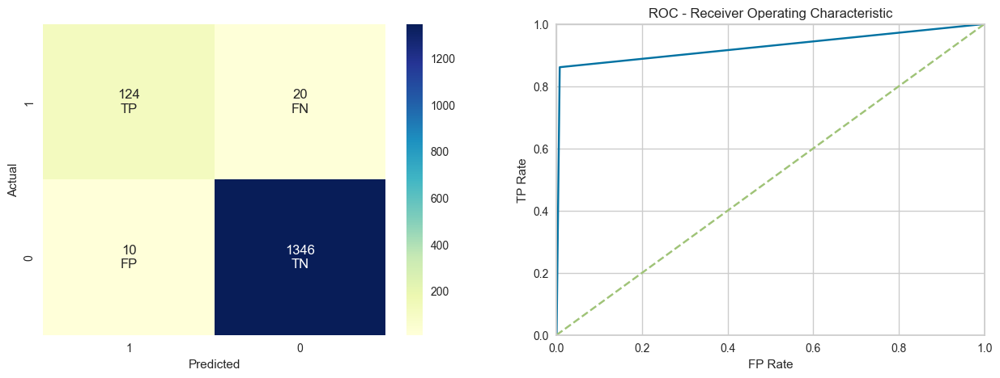

In [94]:
dec_tree1 = DecisionTreeClassifier(criterion = 'gini',class_weight={0:0.15,1:0.85}, random_state=1)
dec_tree1.fit(X_train, y_train)
loan_prediction("Decision Tree", dec_tree1, X_train, X_test, y_train, y_test, plot=True)

y_pred_dec_tree1 = dec_tree1.predict(X_test)



### Decision Tree Visualization


#### Original tree without pre-pruning 

In [95]:
column_names = list(X_dt.columns)
feature_names = column_names
print(feature_names)

['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Mortgage', 'Securities_Account', 'CD_Account', 'Online', 'CreditCard', 'Education_2', 'Education_3']


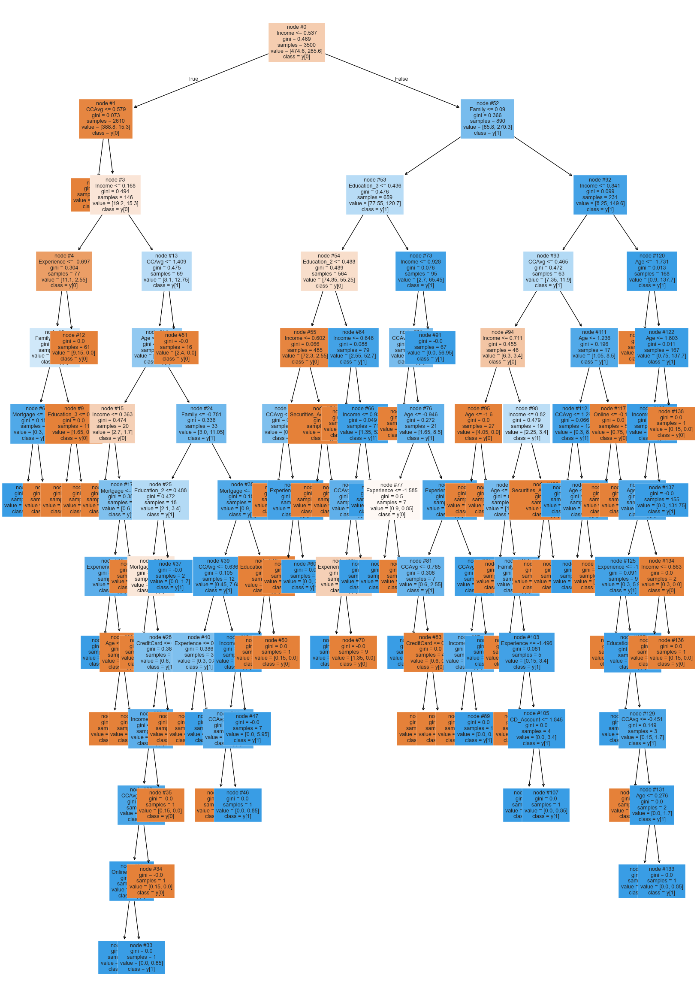

In [96]:
plt.figure(figsize=(20,30))
from sklearn import tree
from sklearn.model_selection import GridSearchCV
out = tree.plot_tree(dec_tree1,feature_names=feature_names,filled=True,fontsize=9,node_ids=True,class_names=True)
for o in out:
     arrow = o.arrow_patch
     if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(1)
plt.show()

#### The tree is observed to be highly overfitting.

### Decision Tree (default) 

In [97]:
model0 = DecisionTreeClassifier(random_state=1)
model0.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

In [98]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

In [99]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

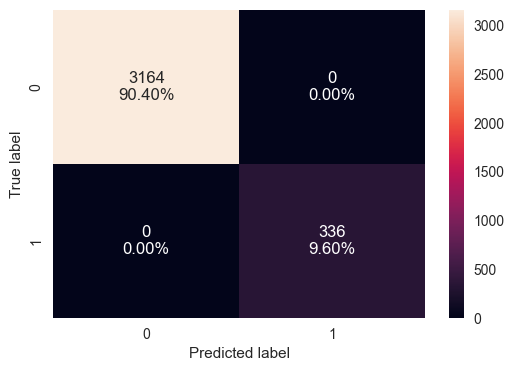

In [100]:
confusion_matrix_sklearn(model0, X_train, y_train)

In [101]:
decision_tree_perf_train_without = model_performance_classification_sklearn(
    model0, X_train, y_train
)
decision_tree_perf_train_without

,Accuracy,Recall,Precision,F1
0,1.0,1.0,1.0,1.0


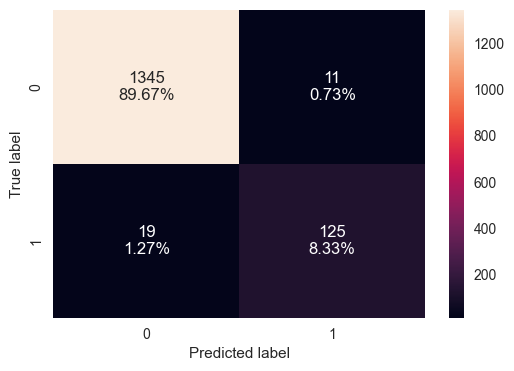

In [102]:
confusion_matrix_sklearn(model0, X_test, y_test)

In [103]:
decision_tree_perf_test_without = model_performance_classification_sklearn(
    model0, X_test, y_test
)
decision_tree_perf_test_without

,Accuracy,Recall,Precision,F1
0,0.98,0.868056,0.919118,0.892857


#### Decision Tree (with class_weights)

* We are setting class_weight = "balanced", which will automatically adjust the weights to be inversely proportional to the class frequencies in the input data

In [104]:
model = DecisionTreeClassifier(random_state=1, class_weight="balanced")
model.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', random_state=1)

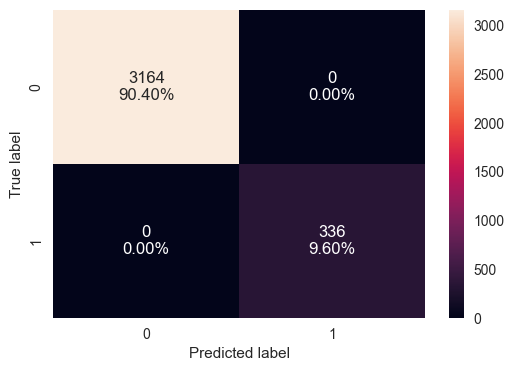

In [105]:
confusion_matrix_sklearn(model, X_train, y_train)

In [106]:
decision_tree_perf_train = model_performance_classification_sklearn(
    model, X_train, y_train
)
decision_tree_perf_train

,Accuracy,Recall,Precision,F1
0,1.0,1.0,1.0,1.0


####

*  Model is able to perfectly classify all the data points on the training set.
*  0 errors on the training set, each sample has been classified correctly.
*  As we know a decision tree will continue to grow and classify each data point correctly if no restrictions are applied as 
   the trees will learn all the patterns in the training set.
* This generally leads to overfitting of the model as Decision Tree will perform well on the training set but will fail 
  to replicate the performance on the test set.

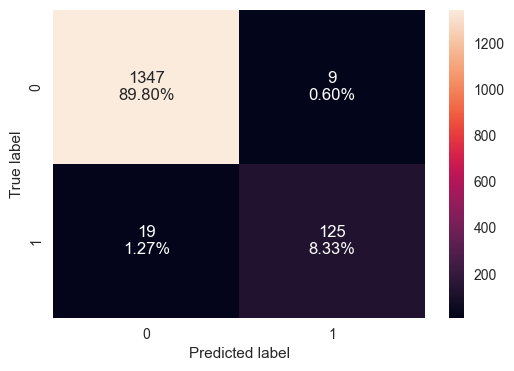

In [107]:
confusion_matrix_sklearn(model, X_test, y_test)

In [108]:
decision_tree_perf_test = model_performance_classification_sklearn(
    model, X_test, y_test
)
decision_tree_perf_test

,Accuracy,Recall,Precision,F1
0,0.981333,0.868056,0.932836,0.899281


#### Its observed to have disparity in performance of model on training set and test set, which suggests that the model is overfiiting.

*  Let's use pruning techniques to try and reduce overfitting.

#### Decision Tree (Pre-pruning)
*  Using GridSearch for Hyperparameter tuning of our tree model

*  Optimum values of hyperparameters is computed using grid search tuning technique.It is an exhaustive search that is 
   performed  on a the specific parameter values of a model. The parameters of the estimator/model used to apply these methods
   are optimized by cross-validated grid-search over a parameter grid.

In [109]:
# Choose the type of classifier.
estimator = DecisionTreeClassifier(random_state=1)

# Grid of parameters to choose from

parameters = {'max_depth': np.arange(1,10),
              'min_samples_leaf': [1, 2, 5, 7, 10,15,20],
              'max_leaf_nodes' : [5, 10,15,20,25,30],
              }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(estimator, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
estimator = grid_obj.best_estimator_
estimator


DecisionTreeClassifier(max_depth=8, max_leaf_nodes=25, random_state=1)

In [110]:
# Fit the best algorithm to the data.
estimator.fit(X_train, y_train)
ytrain_predict_hp=estimator.predict(X_train)
ytest_predict_hp=estimator.predict(X_test)

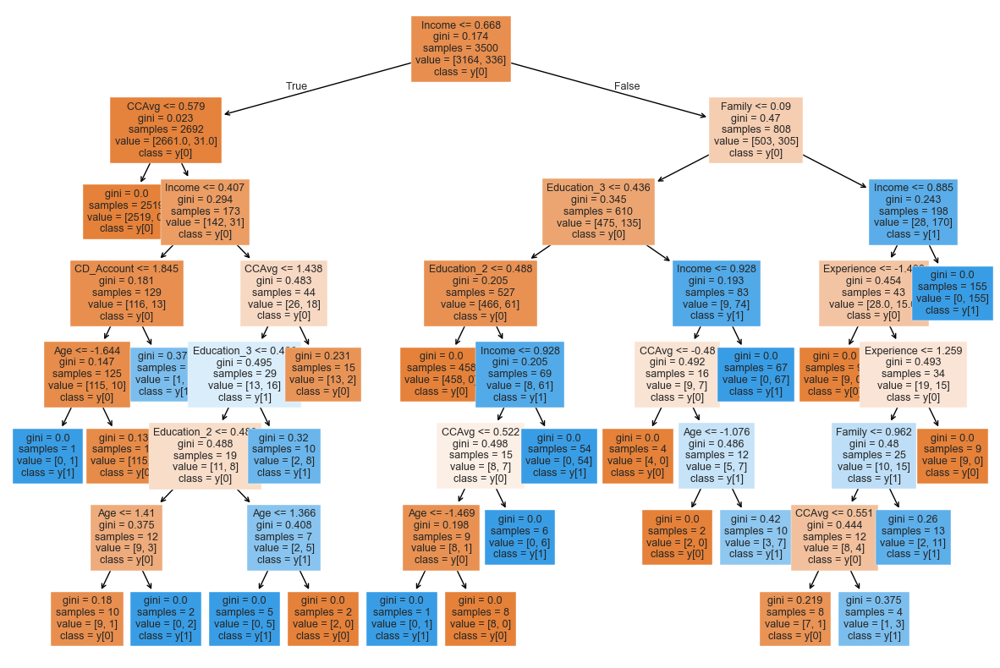

In [111]:
plt.figure(figsize=(15,10))

out = tree.plot_tree(estimator,feature_names=feature_names,filled=True,fontsize=9,node_ids=False,class_names=True)
for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(1)
plt.show()

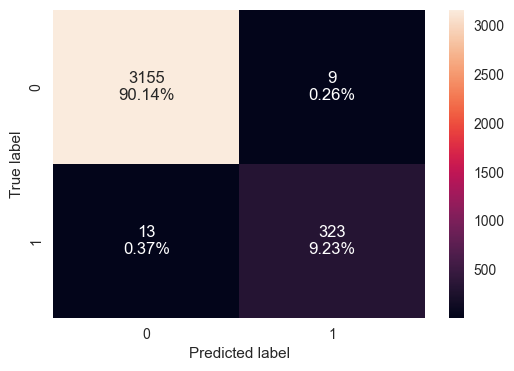

In [112]:
confusion_matrix_sklearn(estimator, X_train, y_train)

In [113]:
decision_tree_tune_perf_train = model_performance_classification_sklearn(
    estimator, X_train, y_train
)
decision_tree_tune_perf_train

,Accuracy,Recall,Precision,F1
0,0.993714,0.96131,0.972892,0.967066


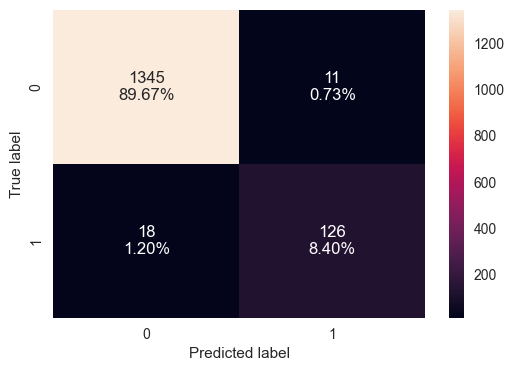

In [114]:
confusion_matrix_sklearn(estimator, X_test, y_test)

In [115]:
decision_tree_tune_perf_test = model_performance_classification_sklearn(
    estimator, X_test, y_test
)
decision_tree_tune_perf_test

,Accuracy,Recall,Precision,F1
0,0.980667,0.875,0.919708,0.896797


*  The model is giving a generalized result now since the recall scores on both the train and test data are coming to be 
   around 0.96 which shows that the model is able to generalize well on unseen data. 

In [116]:
# Choose the type of classifier.
estimator = DecisionTreeClassifier(random_state=1)

# Grid of parameters to choose from

parameters = {'max_depth': np.arange(1,10),
              'min_samples_leaf': [1, 2, 5, 7, 10,15,20],
              'max_leaf_nodes' : [5, 10,15,20,25,30],
              }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(estimator, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
estimator = grid_obj.best_estimator_
estimator

DecisionTreeClassifier(max_depth=8, max_leaf_nodes=25, random_state=1)

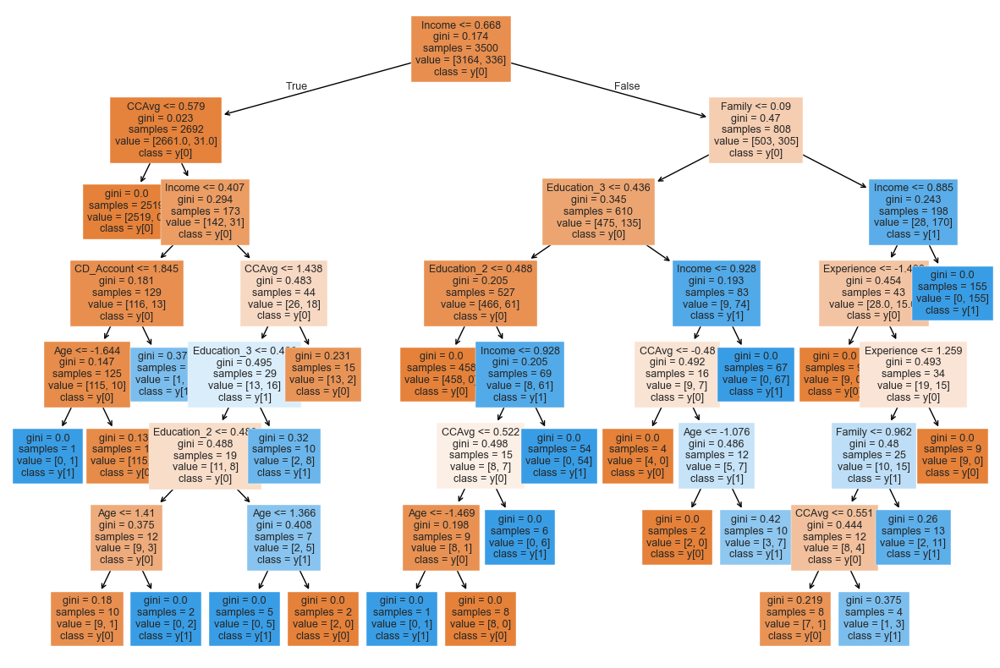

In [117]:
plt.figure(figsize=(15,10))

out = tree.plot_tree(estimator,feature_names=feature_names,filled=True,fontsize=9,node_ids=False,class_names=True)
for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(1)
plt.show()

In [118]:
# Text report showing the rules of a decision tree -
print(tree.export_text(estimator, feature_names=feature_names, show_weights=True))

|--- Income <= 0.67
|   |--- CCAvg <= 0.58
|   |   |--- weights: [2519.00, 0.00] class: 0
|   |--- CCAvg >  0.58
|   |   |--- Income <= 0.41
|   |   |   |--- CD_Account <= 1.85
|   |   |   |   |--- Age <= -1.64
|   |   |   |   |   |--- weights: [0.00, 1.00] class: 1
|   |   |   |   |--- Age >  -1.64
|   |   |   |   |   |--- weights: [115.00, 9.00] class: 0
|   |   |   |--- CD_Account >  1.85
|   |   |   |   |--- weights: [1.00, 3.00] class: 1
|   |   |--- Income >  0.41
|   |   |   |--- CCAvg <= 1.44
|   |   |   |   |--- Education_3 <= 0.44
|   |   |   |   |   |--- Education_2 <= 0.49
|   |   |   |   |   |   |--- Age <= 1.41
|   |   |   |   |   |   |   |--- weights: [9.00, 1.00] class: 0
|   |   |   |   |   |   |--- Age >  1.41
|   |   |   |   |   |   |   |--- weights: [0.00, 2.00] class: 1
|   |   |   |   |   |--- Education_2 >  0.49
|   |   |   |   |   |   |--- Age <= 1.37
|   |   |   |   |   |   |   |--- weights: [0.00, 5.00] class: 1
|   |   |   |   |   |   |--- Age >  1.37
|   |  

Classification report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1356
           1       0.92      0.88      0.90       144

    accuracy                           0.98      1500
   macro avg       0.95      0.93      0.94      1500
weighted avg       0.98      0.98      0.98      1500

Area under the curve:  0.9334439528023598


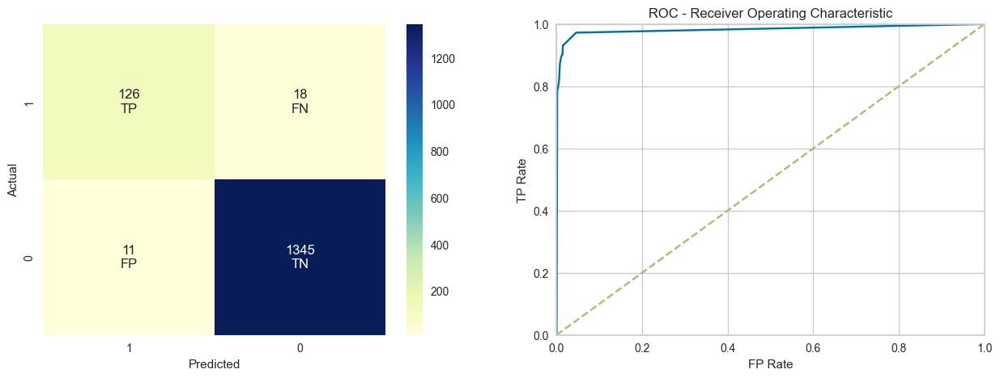

In [119]:
#get_recall_score(model)
loan_prediction("Decision Tree", estimator, X_train, X_test, y_train, y_test, plot=True)

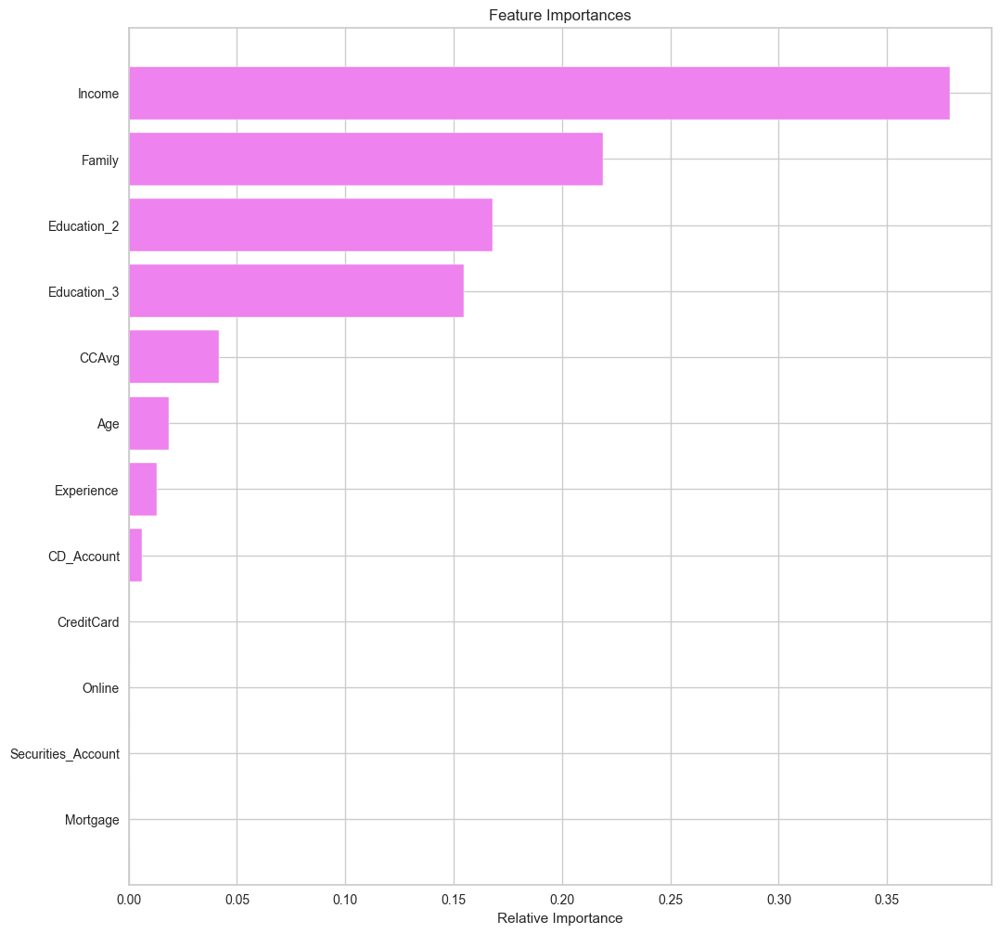

In [120]:
importances = estimator.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

*


* In the pre pruned decision tree also, Education and Income are the most important features.

### Decision Tree (Post pruning) 

### Model Building

In [121]:
post_pru_model = DecisionTreeClassifier(ccp_alpha=0.002,
                       class_weight={0: 0.15, 1: 0.85}, random_state=1)
post_pru_model.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.002, class_weight={0: 0.15, 1: 0.85},
                       random_state=1)

Classification report:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98      1356
           1       0.71      0.97      0.82       144

    accuracy                           0.96      1500
   macro avg       0.85      0.96      0.90      1500
weighted avg       0.97      0.96      0.96      1500

Area under the curve:  0.964724680432645


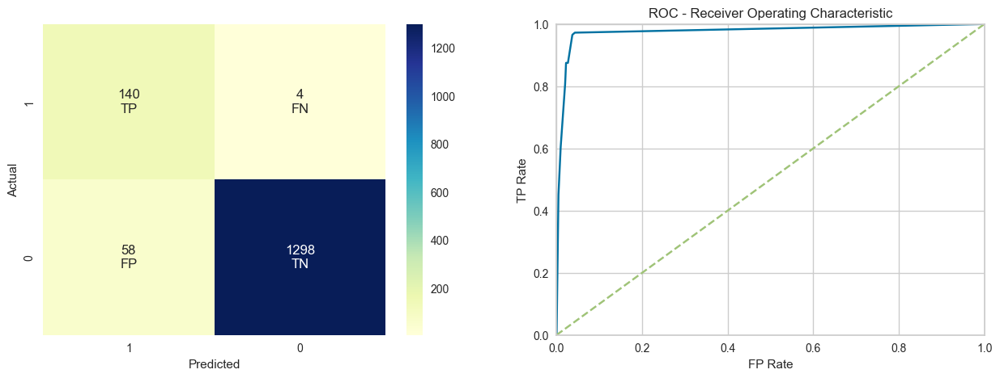

In [122]:
# Now we do get_recall_score(model)
loan_prediction("Decision Tree", post_pru_model, X_train, X_test, y_train, y_test, plot=True)

##### Total impurity of leaves vs effective alphas of pruned tree

In [123]:
clf = DecisionTreeClassifier(random_state=1, class_weight="balanced") # {0: 0.15, 1: 0.85}
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = abs(path.ccp_alphas), path.impurities

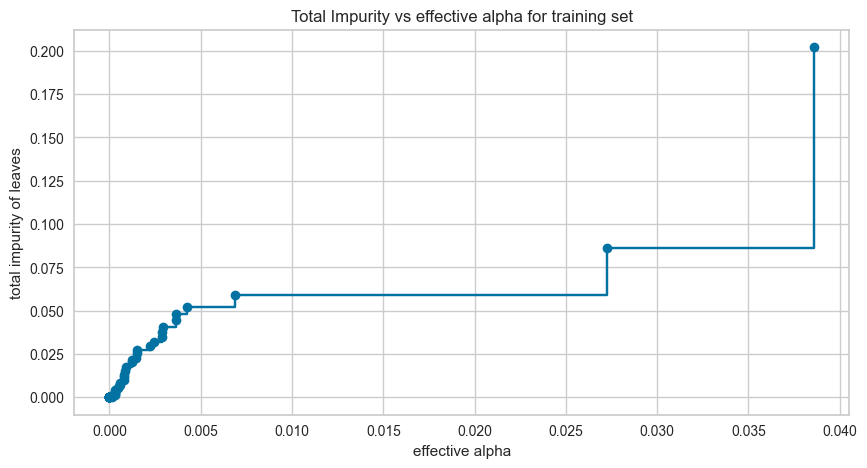

In [124]:
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")
plt.show()


*  Next, we train a decision tree using the effective alphas. The last value in ccp_alphas is the alpha value that prunes 
  the  whole tree, leaving the tree, clfs[-1], with one node.

In [125]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(
        random_state=1, ccp_alpha=ccp_alpha, class_weight="balanced"
    )
    clf.fit(X_train, y_train)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.29792729936894524


*  For the remainder, we remove the last element in clfs and ccp_alphas, because it is the trivial tree with only one node. Here we show that the number of nodes and tree depth decreases as alpha increases.

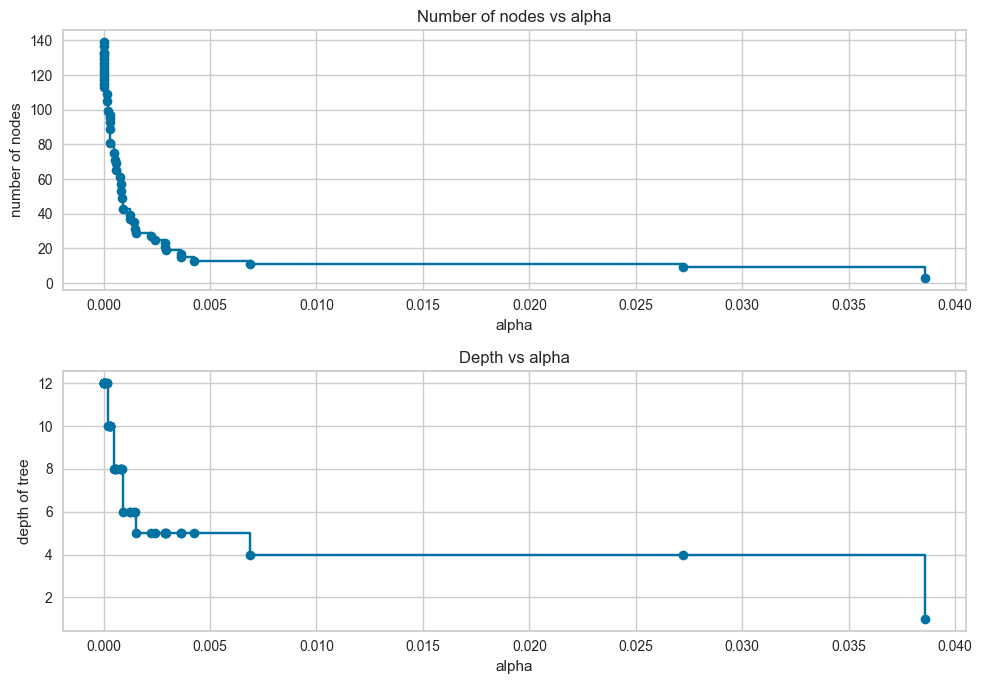

In [126]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1, figsize=(10, 7))
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()


In [127]:
recall_train = []
for clf in clfs:
    pred_train = clf.predict(X_train)
    values_train = recall_score(y_train, pred_train)
    recall_train.append(values_train)

In [128]:
recall_test = []
for clf in clfs:
    pred_test = clf.predict(X_test)
    values_test = recall_score(y_test, pred_test)
    recall_test.append(values_test)

In [129]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

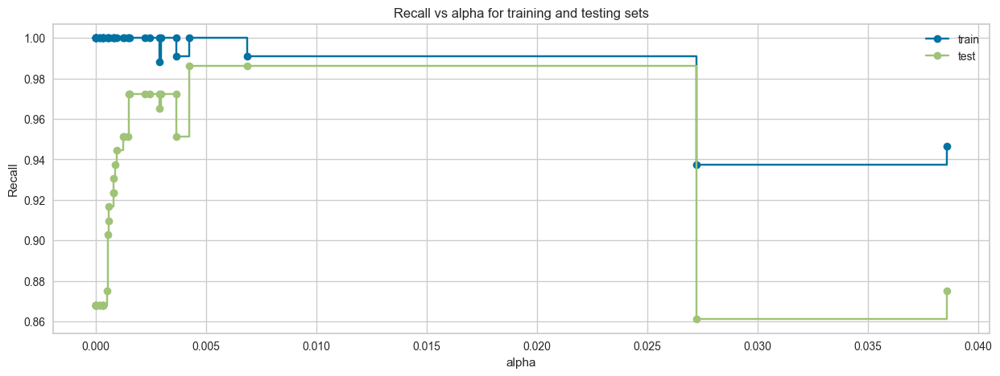

In [130]:
fig, ax = plt.subplots(figsize=(15, 5))
ax.set_xlabel("alpha")
ax.set_ylabel("Recall")
ax.set_title("Recall vs alpha for training and testing sets")
ax.plot(
    ccp_alphas, recall_train, marker="o", label="train", drawstyle="steps-post",
)
ax.plot(ccp_alphas, recall_test, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [131]:
# creating the model where we get highest train and test recall
index_best_model = np.argmax(recall_test)
best_model = clfs[index_best_model]
print(best_model)

DecisionTreeClassifier(ccp_alpha=0.00424065816090001, class_weight='balanced',
                       random_state=1)


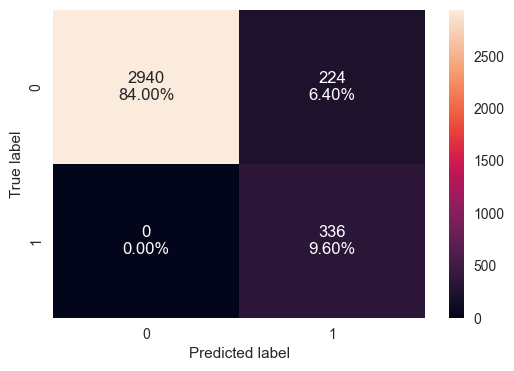

In [132]:
confusion_matrix_sklearn(best_model, X_train, y_train)

In [133]:
decision_tree_post_perf_train = model_performance_classification_sklearn(
    best_model, X_train, y_train
)
decision_tree_post_perf_train

,Accuracy,Recall,Precision,F1
0,0.936,1.0,0.6,0.75


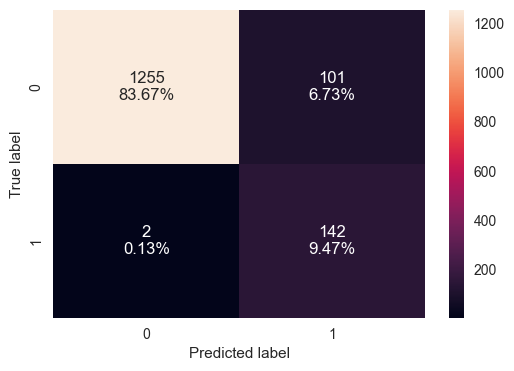

In [134]:
confusion_matrix_sklearn(best_model, X_test, y_test)

In [135]:
decision_tree_post_test = model_performance_classification_sklearn(
    best_model, X_test, y_test
)
decision_tree_post_test

,Accuracy,Recall,Precision,F1
0,0.931333,0.986111,0.584362,0.73385


*  In the post-pruned tree also, the model is giving a generalized result since the recall scores on both the train and test data are coming to be around 0.90 which shows that the model is able to generalize well on unseen data.

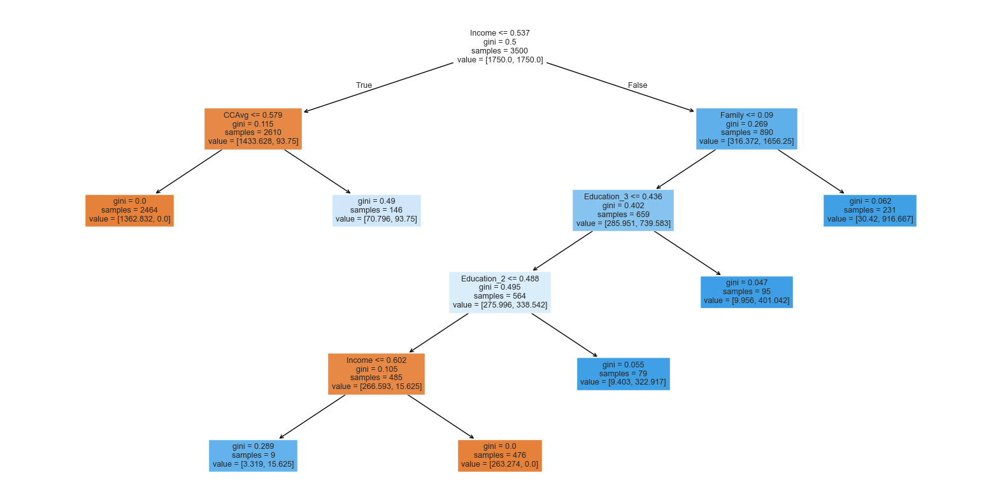

In [136]:
plt.figure(figsize=(20, 10))

out = tree.plot_tree(
    best_model,
    feature_names=feature_names,
    filled=True,
    fontsize=9,
    node_ids=False,
    class_names=None,
)
for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor("black")
        arrow.set_linewidth(1)
plt.show()

In [137]:
post_pru_model.fit(X_train, y_train)
y_test_pred_dtree_postprun = post_pru_model.predict(X_test)
y_train_pred_dtree_postprune = post_pru_model.predict(X_train)

result_dtree_postpru_test=pd.DataFrame(data=[accuracy_score(y_test, y_test_pred_dtree_postprun),
                                precision_score(y_test, y_test_pred_dtree_postprun, average='macro'),
                                recall_score(y_test, y_test_pred_dtree_postprun, average='macro'),
                                f1_score(y_test, y_test_pred_dtree_postprun, average='macro')],
                          index=['Accuracy','Precision','Recall','F1-score'],
                          columns = ['Decision tree post prunning Results - Test dataset'])
result_dtree_postpru_test

,Decision tree post prunning Results - Test dataset
Accuracy,0.958667
Precision,0.851999
Recall,0.964725
F1-score,0.897694


In [138]:
result_dtree_postpru_train = pd.DataFrame(data=[accuracy_score(y_train, y_train_pred_dtree_postprune),
                                precision_score(y_train, y_train_pred_dtree_postprune, average='macro'),
                                recall_score(y_train, y_train_pred_dtree_postprune, average='macro'),
                                f1_score(y_train, y_train_pred_dtree_postprune, average='macro')],
                          index=['Accuracy','Precision','Recall','F1-score'],
                          columns = ['Decison Tree post pruning Results - Train dataset'])
result_dtree_postpru_train

,Decison Tree post pruning Results - Train dataset
Accuracy,0.971143
Precision,0.884439
Recall,0.984039
F1-score,0.926560


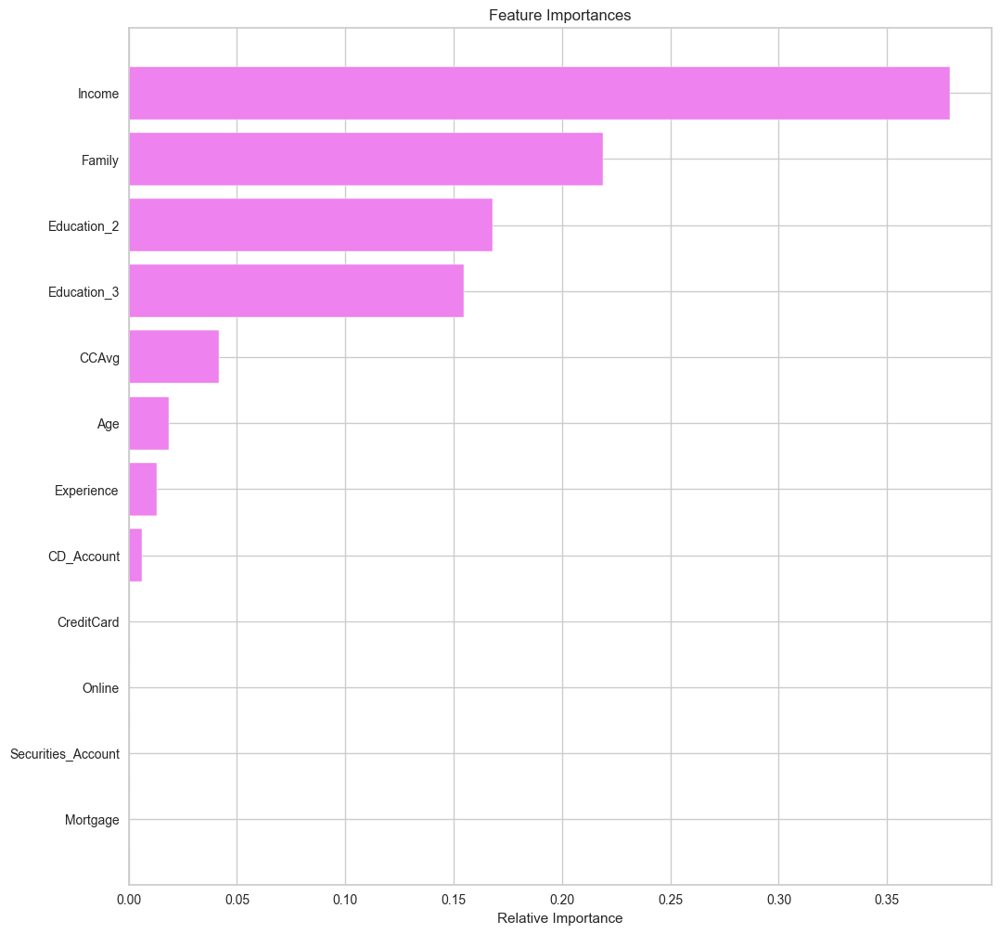

In [139]:
importances = estimator.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

* In the post pruned decision tree also, Income, Family, and Education (Education2 & Education3) are the most important features.

##### Model Performance improvement process

* We did EDA, cleaned the data and tried with Logistic regression model, the accuracy was good but the recall was not efficient.
* Then we analysed with decision tree model as original and we saw that it was overfitting
* We started pre-pruning with HyperParameter max_depth=9, max_leaf_nodes=30, the overfitting on training has reduced, but the 'recall' for test has not improved. 
* Income,Family, Education 2 & Education 3, CCAvg, and Age is observed to be of more important features.
* Then we tested out model by post prunning with ccp_alpha and we got good results with both accuracy and recall, 
* Important features are Income,Family, Education 2 and Education 3, CCAvg & Age.

## Model Comparison and Final Model Selection

In [140]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        decision_tree_perf_train_without.T,
        decision_tree_perf_train.T,
        decision_tree_tune_perf_train.T,
        decision_tree_post_perf_train.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Decision Tree without class_weight",
    "Decision Tree with class_weight",
    "Decision Tree (Pre-Pruning)",
    "Decision Tree (Post-Pruning)",
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Decision Tree without class_weight,Decision Tree with class_weight,Decision Tree (Pre-Pruning),Decision Tree (Post-Pruning)
Accuracy,1.0,1.0,0.993714,0.936
Recall,1.0,1.0,0.961310,1.000
Precision,1.0,1.0,0.972892,0.600
F1,1.0,1.0,0.967066,0.750


In [141]:
# testing performance comparison

models_test_comp_df = pd.concat(
    [
        decision_tree_perf_test_without.T,
        decision_tree_perf_test.T,
        decision_tree_tune_perf_test.T,
        decision_tree_post_test.T,
    ],
    axis=1,
)
models_test_comp_df.columns = [
    "Decision Tree without class_weight",
    "Decision Tree with class_weight",
    "Decision Tree (Pre-Pruning)",
    "Decision Tree (Post-Pruning)",
]
print("Test set performance comparison:")
models_test_comp_df

Test set performance comparison:


,Decision Tree without class_weight,Decision Tree with class_weight,Decision Tree (Pre-Pruning),Decision Tree (Post-Pruning)
Accuracy,0.980000,0.981333,0.980667,0.931333
Recall,0.868056,0.868056,0.875000,0.986111
Precision,0.919118,0.932836,0.919708,0.584362
F1,0.892857,0.899281,0.896797,0.733850


#### Observations

* Detailed analysis of the given campaign data, employing both Exploratory Data Analysis (EDA) and model building, come out 
  with valuable insights into the likelihood of a customer opting for a loan.

* Initially, we tried Logistic Regression to bring out a model, with Recall as our key performance metric. We found that
  variables such as Income, Education, CD Account, Family, and CCAvg emerged as significant contributors to the classification
  process.

* Then we explored Decision Trees, initial original tree was highly overfitting. We explored with both prepruned and post-pruned
  Decision Trees. Post-pruned decision Tree yielded impressive 98% recall and 93% accuracy.

* Key variables in predicting a customer's probability to purchase a personal loan are Income, Graduates or higher degree
  holders, and customers having three family members. 


## Actionable Insights and Business Recommendations

* The analysis of our Personal Loan campaign data has offered us a lot of understanding of our customer's likelihood to select for a personal loan. We used Logistic Regression and  Decision Trees to derive these insights.

* Decision Trees, with their low requirements for data preparation and intuitive visualization, are a valuable tool, despite
 their tendency to overfit. On the other hand, Logistic Regression, while more demanding in data preparation, provides a more 
 robust model.

* Our analysis has underscored the importance of factors such as Income, Education, Family size, and Average credit card spending (CCAvg), in predicting the likelihood of a customer taking a personal loan.

* We have identified three distinct customer profiles:

* These are individuals with high income, advanced/graduate level education, families of 3 or 4 members, and high spending 
  habits. These customers have the highest likelihood of taking personal loans.

* These customers have medium income levels, graduate level education, families of 3 or 4 members, and medium spending habits.
  They represent our second priority.

* These customers have lower income, undergraduate education, families of 3 or 4 members, and low spending habits. Currently, our model has difficulty identifying exceptional cases within this group who may be inclined to take a personal loan. 

##### What recommedations would you suggest to the bank?

* Future strategies should focus to the average profile customers, creating attractive schemes and offers to attract them.
* Bank should focus for more mortgage customers, that could bring revenue thru multiple products.

### Happy Banking !!!